# Load packages

In [1]:
import os
#os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
#os.environ["CUDA_VISIBLE_DEVICES"] = ""
import matplotlib.pyplot as plt
import scanpy as sc
import anndata2ri
import logging
from scipy.sparse import csr_matrix, issparse
import numpy as np
import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
#import bbknn
import pandas as pd
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import scipy as sp
import scvi
import torch
scvi.settings.seed = 0

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
#sc.logging.print_versions()


os.chdir('/root/host_home')
sc.logging.print_versions()

Seed set to 0


-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                         10.1.0
absl                        NA
anndata2ri                  1.3.1
anyio                       NA
arrow                       1.3.0
asttokens                   NA
astunparse                  1.6.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.14.0
backcall                    0.2.0
cairo                       1.26.0
certifi                     2023.11.17
cffi                        1.16.0
chardet                     5.2.0
charset_normalizer          3.3.2
chex                        0.1.86
cloudpickle                 3.0.0
comm                        0.2.1
contextlib2                 NA
cupy                        12.3.0
cupy_backends               NA
cupyx                       NA
cycler                      0.12.1
cython_runtime              NA
dask                        2023.11.0
dateutil                    2.8.2
debugpy                     1.8.0
d

# Filenames

In [2]:
#Filename scanpy AnnData input for lp NPC after batch correction
adata_input = 'lp_NPCs/processed_data/lp_NPC_cell_cycle_cuda.h5ad'


#Filename scanpy AnnData output for NPC preprocessing
adata_output = 'lp_NPCs/processed_data/lp_NPC_clustered_scvi_cuda.h5ad'

In [3]:
lane_key = "lane"
donor_key = "Donor"
dataset_key = "cultivation_period"
label_key = "condition"

# Read in data

In [4]:
adata = sc.read(adata_input)


In [4]:
#adata = sc.read(adata_output)

In [ ]:
sc.pl.umap(adata, color=[donor_key, label_key, 'phase'], wspace = 0.5)

# Integration

In [7]:
adata.var['highly_variable'] = adata.var['highly_variable_genes_batch_aware']


In [8]:
#Data preparation
scvi.model.SCVI.setup_anndata(adata, layer="soupX_counts", batch_key=donor_key)
adata

AnnData object with n_obs × n_vars = 30843 × 17250
    obs: 'Donor', 'lane', 'condition', 'age', 'years_of_illness', 'deltaHY', 'deltaUPDRS', 'deltaADL', 'deltaDOPA', 'gender', 'cultivation_period', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_score', 'size_factors', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_symbols', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_genes', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_genes_batch_aware'
    uns: 'Donor_colors', 'condition_colors', 'hvg', 'lane_colors', 'neighbors', 'pca', 'phase_colors', 'umap', '_scvi_uuid', '_sc

In [9]:
#Building the model
model_scvi = scvi.model.SCVI(adata, n_layers=2, n_latent=30)
model_scvi

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [10]:
#Print description of the model
model_scvi.view_anndata_setup()

Anndata setup with scvi-tools version 1.1.2.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'soupX_counts',
│   'batch_key': 'Donor',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │  12   │
│         n_cells          │ 30843 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 17250 │
└──────────────────────────┴───────┘

                 Data Registry                 
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃     scvi-tools Location      ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │ adata.layers['soupX_counts'] │
│    batch     │   adata.obs['_scvi_batch']   │
│    labels    │  adata.obs['_scvi_labels']   │
└──────────────┴──────────────────────────────┘

                     batch State Registry                     
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃   Categories    ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Donor'] │ UKERi1E4-R1-003 │          0          │
│                    │ UKERi1JF-R1-018 │          1          │
│                    │ UKERi82A-R1-002 │          2          │
│                    │ UKERi88H-R1-002 │          3          │
│                    │ UKERiAY6-R1-003 │          4          │
│                    │ UKERiC99-R1-007 │          5          │
│                    │ UKERiG3G-R1-039 │          6          │
│                    │ UKERiJ2C-R1-015 │          7          │
│                    │ UKERiM89-R1-005 │          8          │
│                    │ UKERiO3H-R1-005 │          9          │
│                    │ UKERiPX7-R1-001 │         10          │
│                    │ UKERiR66-R1-007 │         11          │
└────────────────────┴─────────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [11]:
torch.set_float32_matmul_precision('medium')
scvi.settings.dl_num_workers = 15

In [12]:
model_scvi.train(check_val_every_n_epoch=1)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 259/259: 100%|██████| 259/259 [22:16<00:00,  5.16s/it, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.17e+4]

`Trainer.fit` stopped: `max_epochs=259` reached.


Epoch 259/259: 100%|██████| 259/259 [22:16<00:00,  5.16s/it, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.17e+4]


In [13]:
model_scvi.save('lp_NPCs/processed_data/model_scvi_CC', overwrite=True)

In [14]:
#model_scvi = scvi.model.SCVI.load('lp_NPCs/processed_data/model_scvi_CC', adata)

In [15]:
#Extract embeddings
adata.obsm["X_scVI_CC"] = model_scvi.get_latent_representation()

In [16]:
#Calculate bath-corrected UMAP
sc.pp.neighbors(adata, use_rep="X_scVI_CC")
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


In [17]:
adata.uns['neighbors_CC'] = adata.uns['neighbors']
adata.obsp['distances_CC'] = adata.obsp['distances']
adata.obsp['connectivities_CC'] = adata.obsp['connectivities']
adata.obsm['X_umap_CC'] = adata.obsm['X_umap']

In [ ]:
sc.pl.umap(adata, color=['phase', donor_key, label_key], wspace = 0.5)

# Clustering

In [19]:
sc.tl.leiden(adata, key_added="leiden_res0_1", resolution=0.1)
sc.tl.leiden(adata, key_added="leiden_res0_2", resolution=0.2)
sc.tl.leiden(adata, key_added="leiden_res0_3", resolution=0.3)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res0_7", resolution=0.7)

running Leiden clustering
    finished: found 4 clusters and added
    'leiden_res0_1', the cluster labels (adata.obs, categorical) (0:00:08)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res0_2', the cluster labels (adata.obs, categorical) (0:00:13)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_res0_3', the cluster labels (adata.obs, categorical) (0:00:20)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_res0_5', the cluster labels (adata.obs, categorical) (0:00:16)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_res0_7', the cluster labels (adata.obs, categorical) (0:00:28)


In [20]:
sc.tl.leiden(adata, key_added="leiden_res0_7", resolution=0.8)
sc.tl.leiden(adata, key_added="leiden_res0_9", resolution=0.9)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden_res0_8', the cluster labels (adata.obs, categorical) (0:00:18)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_res0_9', the cluster labels (adata.obs, categorical) (0:00:23)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden_res1', the cluster labels (adata.obs, categorical) (0:00:17)


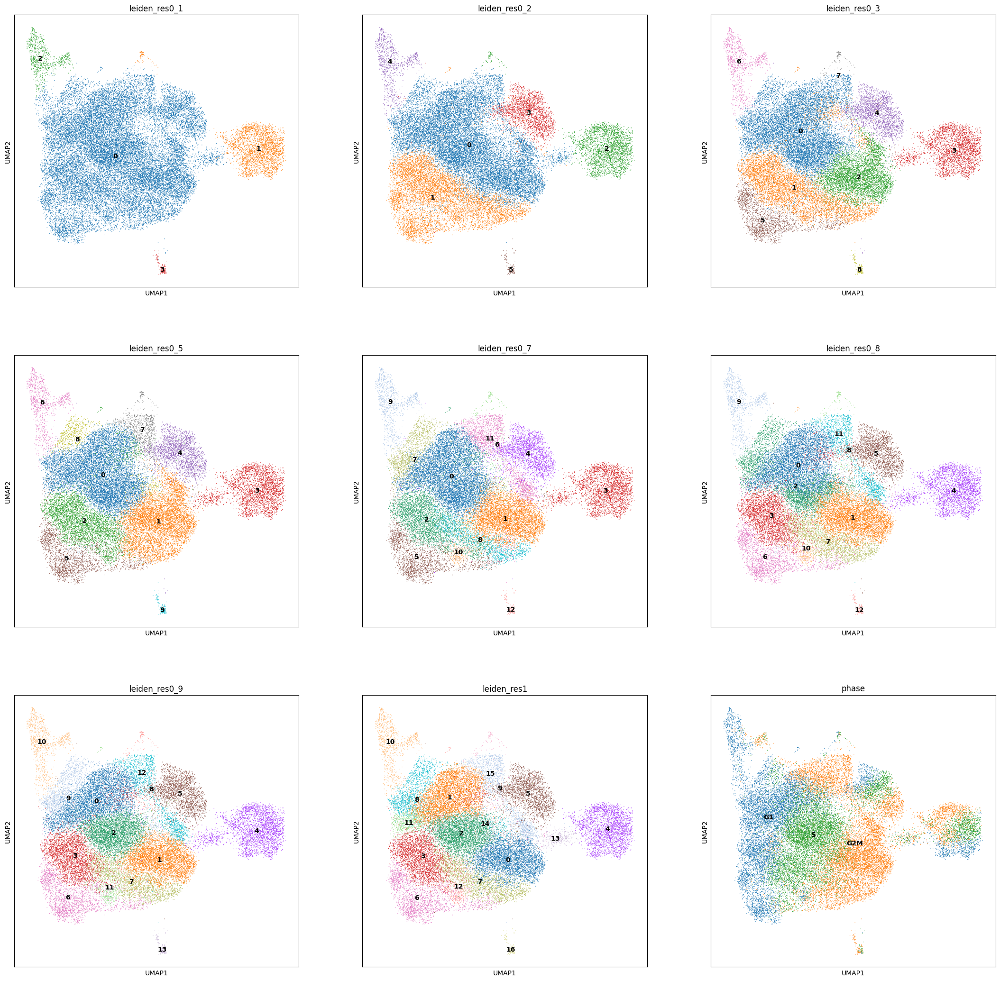

In [21]:
sc.pl.umap(adata, color=['leiden_res0_1', "leiden_res0_2", "leiden_res0_3",
                        'leiden_res0_5', 'leiden_res0_7', 'leiden_res0_7',
                         'leiden_res0_9', 'leiden_res1', 'phase'], ncols=3, legend_loc="on data")

In [ ]:
sc.pl.umap(adata, color=[donor_key, label_key, 'phase'], ncols=3, wspace = 0.5)

In [ ]:
sc.pl.umap(adata, color=['total_counts', "pct_counts_mt", "pct_counts_ribo"], ncols=3, legend_loc="on data")

## Expression of interesting genes

In [24]:
genes =['SOX2', 'FABP7', 'DAAM1', 'PTCH1',
        'SOX2', 'SHH','FOXA2','HES1',
        'SOX10','S100B', 'MPZ', 'DCX','MAP2',
        'BCL2','BAX','LUM','LGALS1',
        'CENPF','AURKB','CDC20']

In [ ]:
sc.pl.umap(adata, size=10, color=genes, ncols=4, title=genes+[''], use_raw=True, vmin=0, vmax="p99", sort_order=False, frameon=False, cmap="Reds")

## Marker genes

### Calculate marker genes and load old marker sets

In [26]:
sc.tl.rank_genes_groups(adata, groupby='leiden_res0_1', key_added='rank_genes_leiden_res0_1', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_res0_2', key_added='rank_genes_leiden_res0_2', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_res0_3', key_added='rank_genes_leiden_res0_3', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_res0_5', key_added='rank_genes_leiden_res0_5', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_res0_7', key_added='rank_genes_leiden_res0_7', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_res0_7', key_added='rank_genes_leiden_res0_7', use_raw=True, method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_leiden_res0_1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:14)
ranking genes
    finished: added to `.uns['rank_genes_leiden_res0_2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:17)
ranking genes
    finished: added to `.uns['rank_genes_leiden_res0_3']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorte

In [27]:
sc.tl.rank_genes_groups(adata, groupby='leiden_res1', key_added='rank_genes_leiden_res1', use_raw=True, method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_leiden_res1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:32)


In [28]:
marker = pd.read_csv('general_input_files/marker_old.txt')

In [29]:
marker_genes = dict()
marker_genes['Glial precursors'] = marker['Glial precursors'].tolist()
marker_genes['Immature neurons'] = marker['Immature neurons'].tolist()
marker_genes['NCSC'] = marker['NCSC'].tolist()
marker_genes['NSC1a'] = marker['NSC1a'].tolist()
marker_genes['NSC1b'] = marker['NSC1b'].tolist()
marker_genes['NSC2a'] = marker['NSC2a'].tolist()
marker_genes['NSC2b'] = marker['NSC2b'].tolist()
marker_genes['Apop. NCSC'] = marker['Apop. NCSC'].tolist()
marker_genes['Apop. NSC'] = marker['Apop. NSC'].tolist()

### leiden res 0.1


In [30]:
pd.DataFrame(adata.uns['rank_genes_leiden_res0_1']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_res0_1.csv')

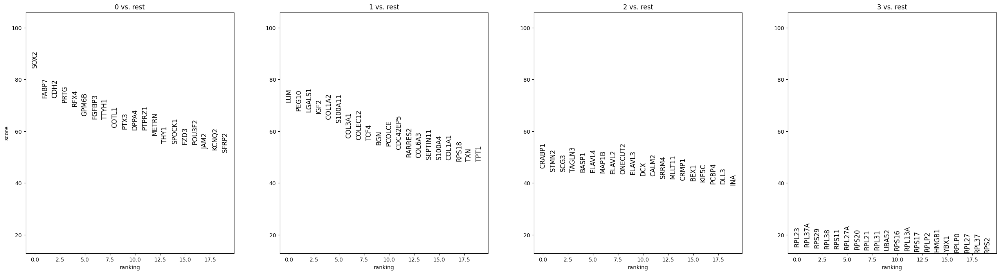

In [31]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_res0_1', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res0_1']`


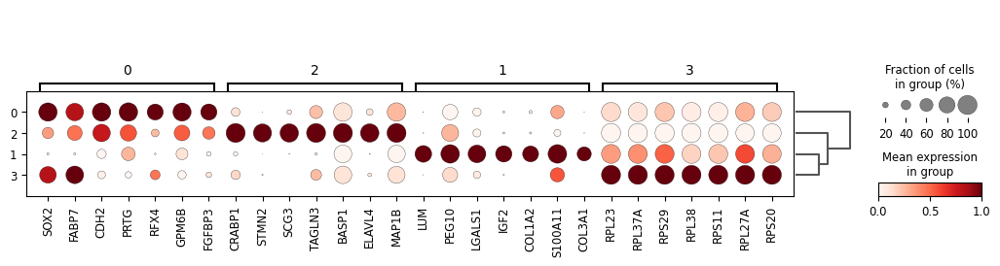

In [32]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res0_1", standard_scale="var", n_genes=7, key="rank_genes_leiden_res0_1")

In [33]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_res0_1", key_added="rank_genes_leiden_res0_1_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


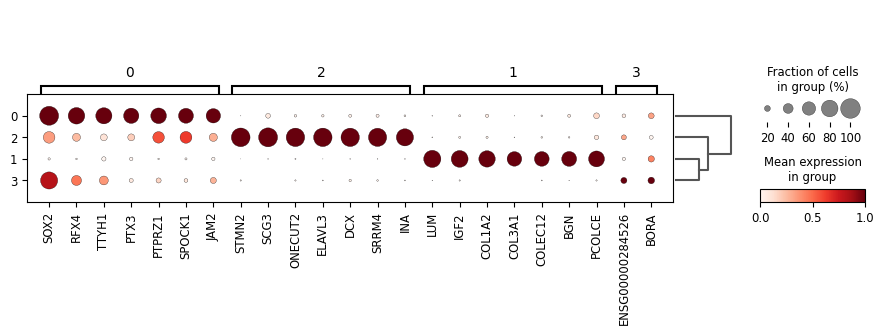

In [34]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res0_1", standard_scale="var", n_genes=7, key="rank_genes_leiden_res0_1_filtered")

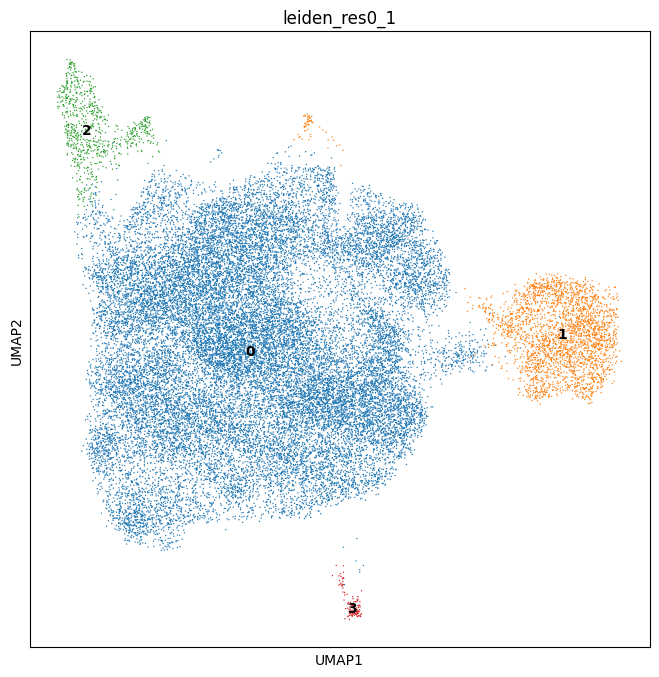

In [35]:
sc.pl.umap(adata, color=["leiden_res0_1"], legend_loc="on data")

<Axes: >

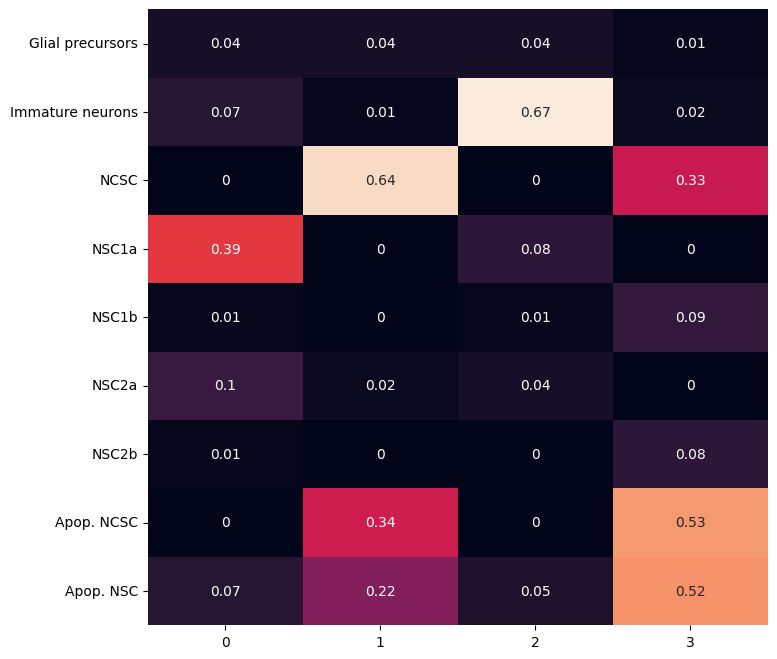

In [36]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_res0_1', normalize='reference'), cbar=False, annot=True)

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_res0_1', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_res0_1', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_res0_1', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_res0_1', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_res0_1', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_res0_1', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_res0_1', use_raw=True)

In [38]:
adata.obs['leiden_res0_1'].value_counts()

leiden_res0_1
0    27290
1     2665
2      773
3      115
Name: count, dtype: int64

In [39]:
adata.obs.groupby(by='leiden_res0_1')['phase'].value_counts()

leiden_res0_1  phase
0              G2M      9621
               S        9104
               G1       8565
1              G2M      1100
               S         960
               G1        605
2              G1        600
               G2M       117
               S          56
3              G2M        79
               S          31
               G1          5
Name: count, dtype: int64

Annotation:

As expected, visualization is dominated by cell cycle effects.

Cluster 0: NSC
- High expression of classical NSC marker such as SOX2

Cluster 1: NCSC
-  High expression of LUM, LGALS1, and a high fraction of ribosome and extracellular matrix constituents

Cluster 2: Immature neurons
- High expression of neuronal genes DCX, MAP2, TUBB3

Cluster 3: Apop. NCSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- low levels of BCL2, high levels of BAX


Plotting of marker genes indicates that cluster 0 contains both NSC1 (DAAM1, FABP7, PTCH1, and DLL1), NSC2 (SHH, FOXA2), as well as glial precursors (S100B, SOX10), and Apop. NSCs (low BCL2, high BAX, and low mt counts).
Further subclustering is necessary, to isolate these cell types.
Also a clustering based on cell cycle phases (G2M) vs (G0/1, S) should be done.

In [40]:
adata.rename_categories('leiden_res0_1', ['NSC', 'NCSC', 'Immature neurons', 'Apop. NCSC'])

Omitting rank_genes_leiden_res0_1_filtered/scores as old categories do not match.
Omitting rank_genes_leiden_res0_1_filtered/pvals as old categories do not match.
Omitting rank_genes_leiden_res0_1_filtered/pvals_adj as old categories do not match.
Omitting rank_genes_leiden_res0_1_filtered/logfoldchanges as old categories do not match.


### leiden res 0.2


In [41]:
pd.DataFrame(adata.uns['rank_genes_leiden_res0_2']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_res0_2.csv')

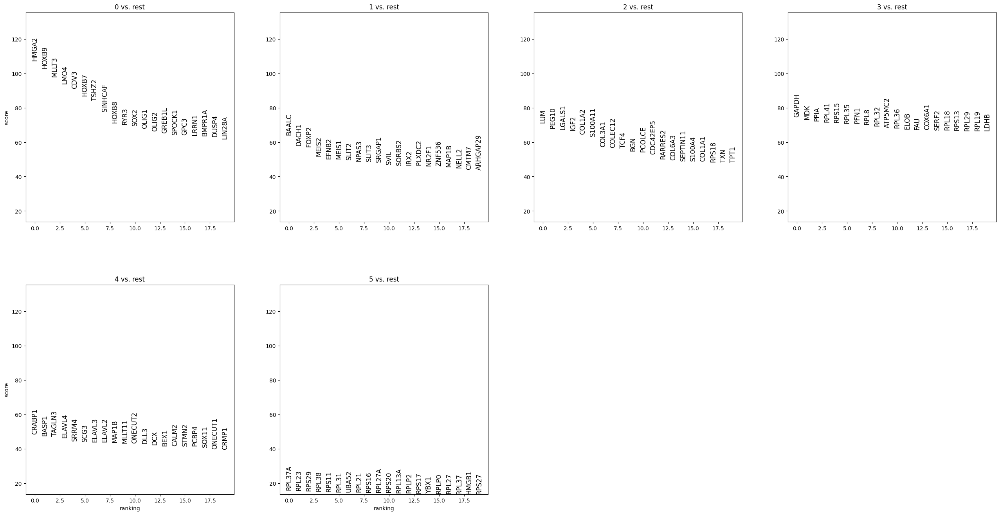

In [42]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_res0_2', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res0_2']`


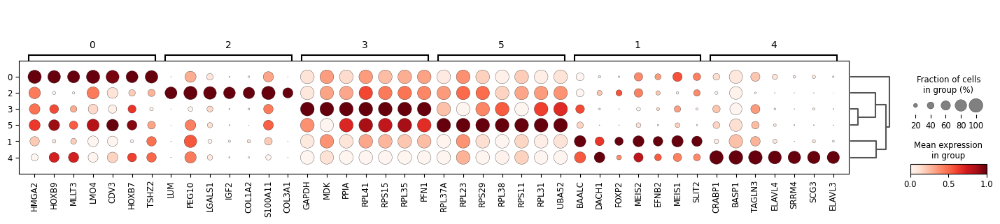

In [43]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res0_2", standard_scale="var", n_genes=7, key="rank_genes_leiden_res0_2")

In [44]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_res0_2", key_added="rank_genes_leiden_res0_2_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


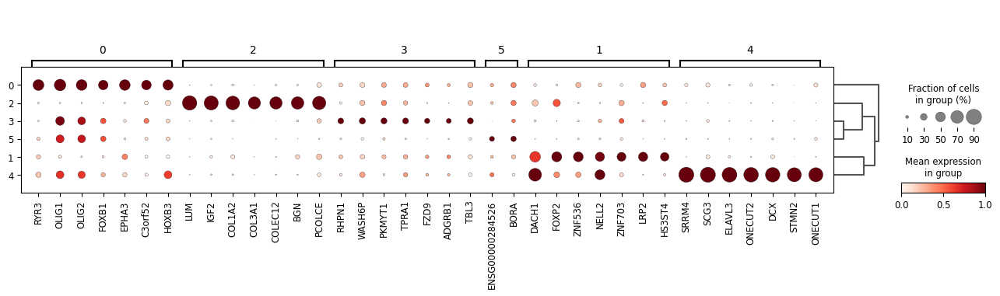

In [45]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res0_2", standard_scale="var", n_genes=7, key="rank_genes_leiden_res0_2_filtered")

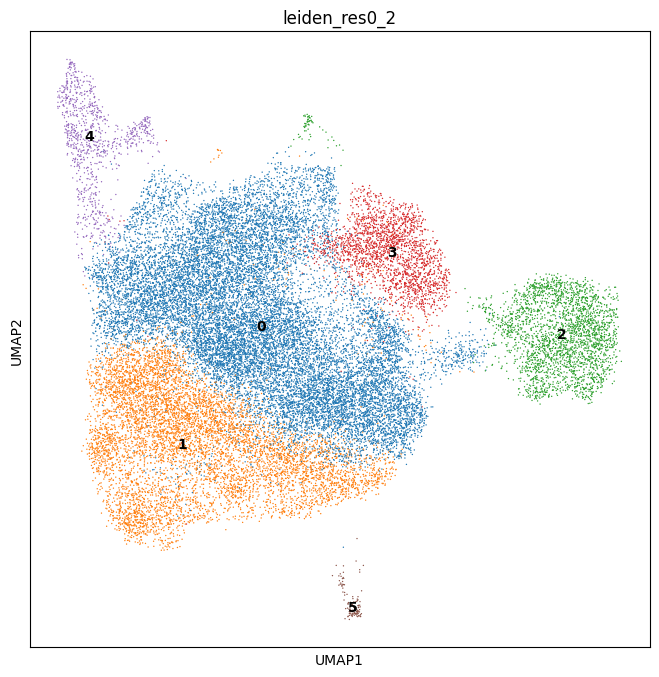

In [46]:
sc.pl.umap(adata, color=["leiden_res0_2"], legend_loc="on data")

<Axes: >

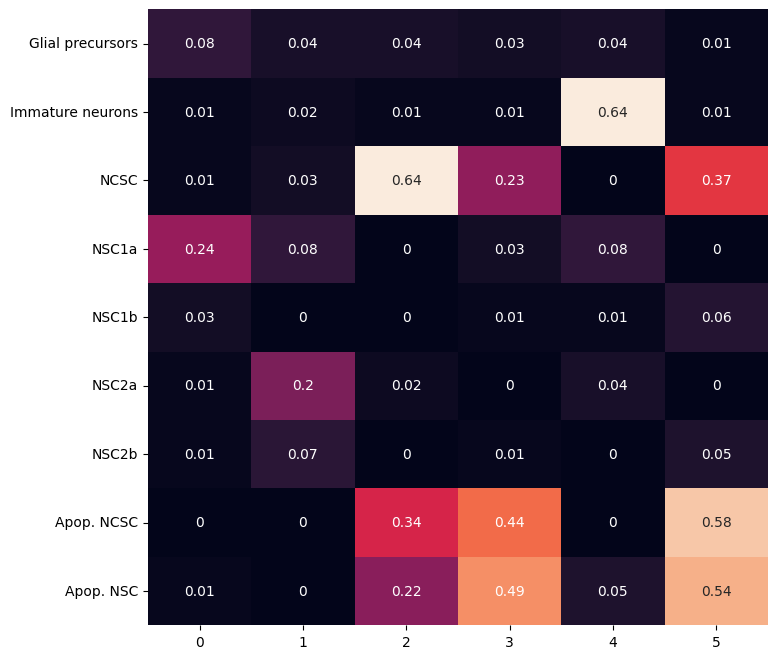

In [47]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_res0_2', normalize='reference'), cbar=False, annot=True)

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_res0_2', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_res0_2', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_res0_2', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_res0_2', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_res0_2', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_res0_2', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_res0_2', use_raw=True)

In [49]:
adata.obs.groupby(by='leiden_res0_2')['phase'].value_counts()

leiden_res0_2  phase
0              G2M      6911
               S        5929
               G1       4719
1              G1       3248
               S        2337
               G2M      1817
2              G2M      1103
               S         962
               G1        607
3              G2M       883
               S         831
               G1        458
4              G1        736
               G2M       122
               S          57
5              G2M        81
               S          35
               G1          7
Name: count, dtype: int64

Annotation:

Cluster 0: NSC1
- High expression of classical NSC marker such as SOX2
- High expression of DAAM1, FABP7, PTCH1, and DLL1
- Markers associated with neuron projection development
- Still contains many G2M phase cells <- refine clustering

Cluster 1: Mix of NSC1 and NSC2
- High expression of classical NSC marker such as SOX2
- Markers are associated with Neuron growth and Neuronal projections / Axon development pathways
- In one part - High expression of NSC2 marker SHH, FOXA2, and HES1 
- In one part - High expression of NSC1 marker DAAM1, FABP7, PTCH1, and DLL1

Cluster 2: NCSC
-  High expression of LUM, LGALS1, and a high fraction of ribosome and extracellular matrix constituents

Cluster 3: Apop. NSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- low levels of BCL2, high levels of BAX

Cluster 4: Immature neurons
- High expression of neuronal genes DCX, MAP2, TUBB3

Cluster 5: Apop. NCSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- low levels of BCL2, high levels of BAX

Cluster 6: Unknown
- High expression of PTCH1
- Markers associated with microtubles, cell adhesion / junctions, signaling
- High expression of BCL2, low expresson of BAX -> not apoptotic
- Very few cells


Apop. cells are nicely separated. Cluster 1 still contains a mixture of NSC1 and NSC2 cells. NSC1 cells still contain some Glial precursors and many G2M phase cells.

### leiden res 0.5


In [50]:
pd.DataFrame(adata.uns['rank_genes_leiden_res0_5']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_res0_5.csv')

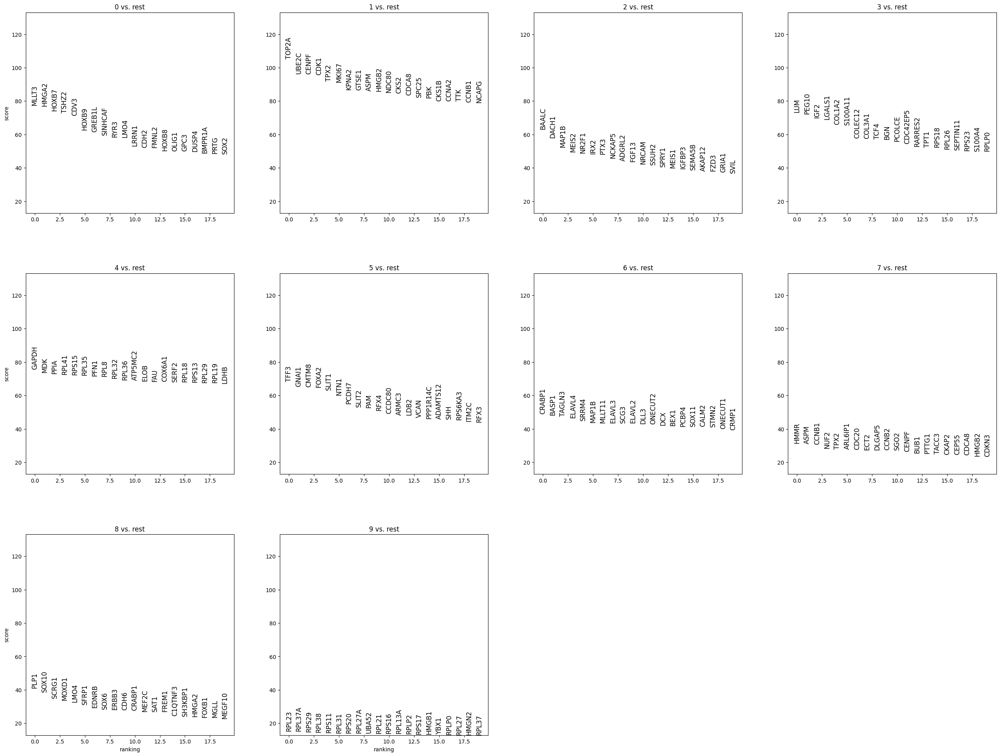

In [51]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_res0_5', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res0_5']`


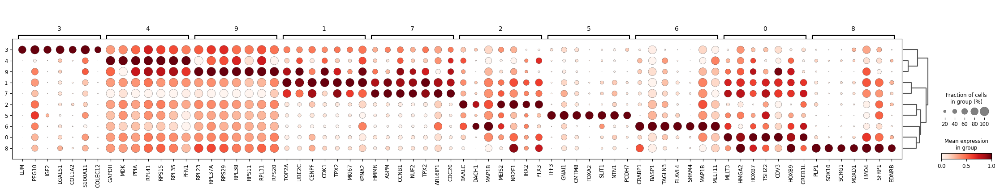

In [52]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res0_5", standard_scale="var", n_genes=7, key="rank_genes_leiden_res0_5")

In [53]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_res0_5", key_added="rank_genes_leiden_res0_5_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


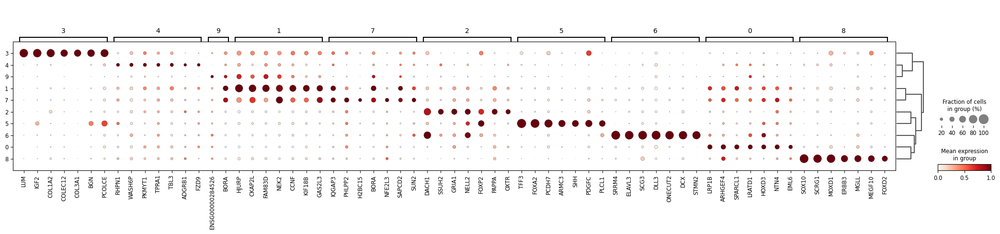

In [54]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res0_5", standard_scale="var", n_genes=7, key="rank_genes_leiden_res0_5_filtered")

In [ ]:
sc.pl.umap(adata, color=["leiden_res0_5"], legend_loc="on data")

<Axes: >

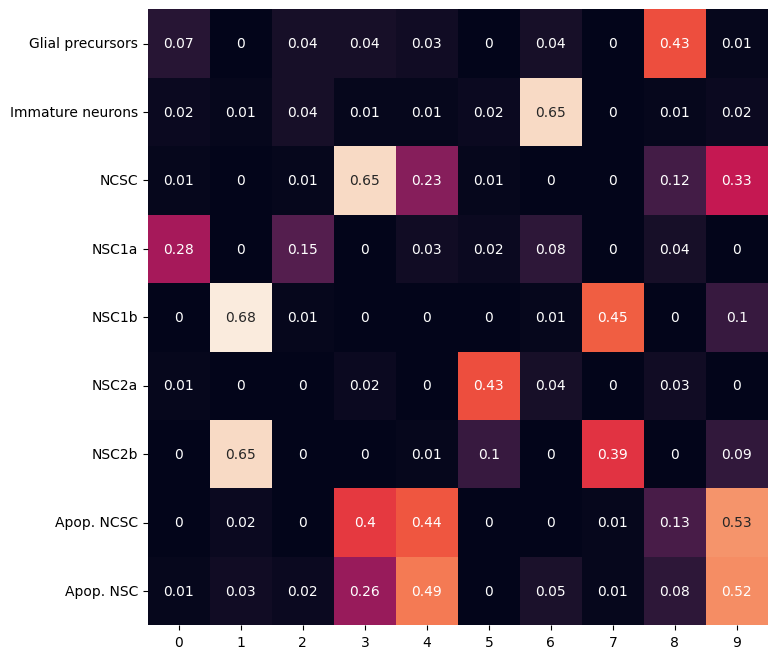

In [56]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_res0_5', normalize='reference'), cbar=False, annot=True)

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_res0_5', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_res0_5', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_res0_5', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_res0_5', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_res0_5', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_res0_5', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_res0_5', use_raw=True)

In [58]:
adata.obs['leiden_res0_5'].value_counts()

leiden_res0_5
0    9842
1    6505
2    4514
3    2854
4    2234
5    2170
6     951
7     929
8     727
9     117
Name: count, dtype: int64

In [59]:
adata.obs.groupby(by='leiden_res0_5')['phase'].value_counts()

leiden_res0_5  phase
0              S        4652
               G1       4061
               G2M      1129
1              G2M      5589
               S         906
               G1         10
2              G1       2015
               S        1895
               G2M       604
3              G2M      1202
               S        1028
               G1        624
4              G2M       888
               S         863
               G1        483
5              G1       1411
               S         427
               G2M       332
6              G1        770
               G2M       123
               S          58
7              G2M       828
               S          59
               G1         42
8              G1        354
               S         232
               G2M       141
9              G2M        81
               S          31
               G1          5
Name: count, dtype: int64

Annotation:

Cluster 0, 2: NSC1
- High expression of classical NSC marker such as SOX2
- High expression of DAAM1, FABP7, PTCH1, and DLL1
- Markers associated with neuron projection development
- Still contains Glial precursors

Cluster 5: NSC2
- High expression of classical NSC marker such as SOX2
- Markers are associated with Neuron growth and Neuronal projections / Axon development pathways
- In one part - High expression of NSC2 marker SHH, FOXA2, and HES1 
- In one part - High expression of NSC1 marker DAAM1, FABP7, PTCH1, and DLL1

Cluster 3: NCSC
-  High expression of LUM, LGALS1, and a high fraction of ribosome and extracellular matrix constituents

Cluster 4: Apop. NSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- low levels of BCL2, high levels of BAX

Cluster 6: Immature neurons
- High expression of neuronal genes DCX, MAP2, TUBB3

Cluster 8: Glial precursors
- High expression of glial markers such as SOX10 and S100B

Cluster 9: Apop. NCSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- low levels of BCL2, high levels of BAX

Cluster 1, 7: NSC (G2M)
- Enrichment of G2M phase cells
- Markers are mainly assoicated with chromosome segregation

Cluster 0 still contains many G2M cells. Refine clustering.

### leiden res 0.7


In [60]:
pd.DataFrame(adata.uns['rank_genes_leiden_res0_7']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_res0_7.csv')

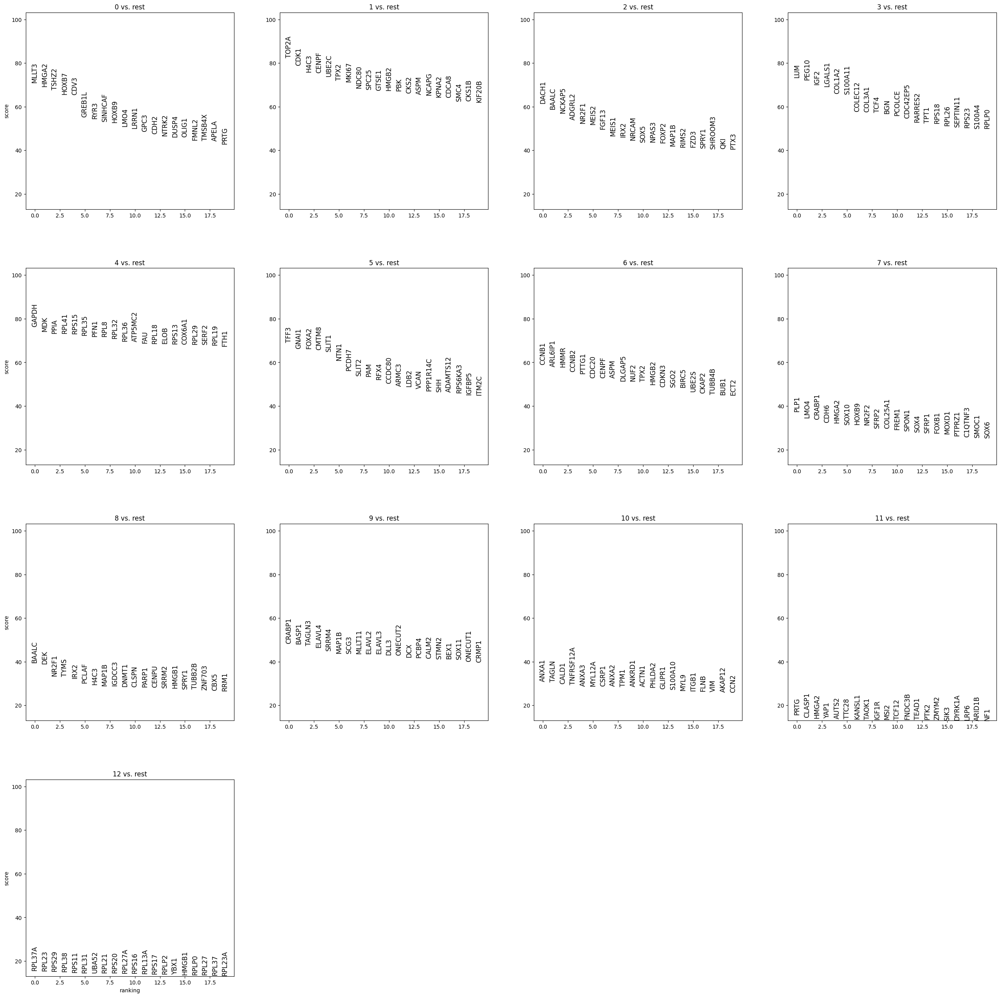

In [61]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_res0_7', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res0_7']`


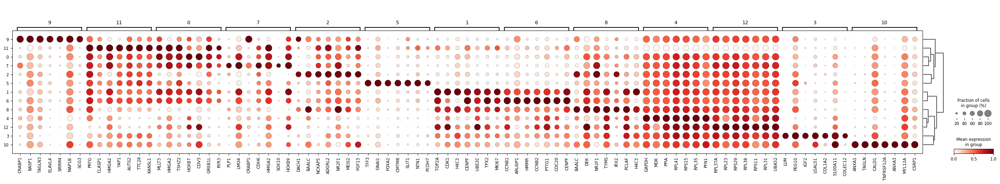

In [62]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res0_7", standard_scale="var", n_genes=7, key="rank_genes_leiden_res0_7")

In [63]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_res0_7", key_added="rank_genes_leiden_res0_7_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


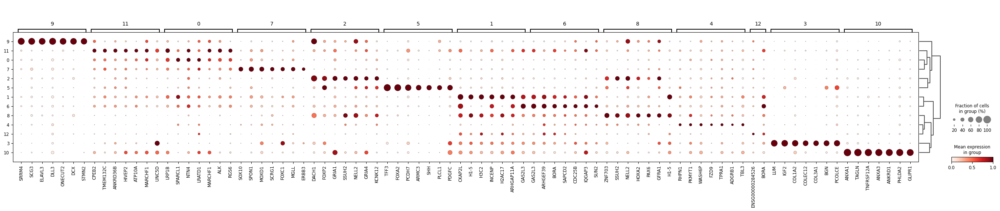

In [64]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res0_7", standard_scale="var", n_genes=7, key="rank_genes_leiden_res0_7_filtered")

In [ ]:
sc.pl.umap(adata, color=["leiden_res0_7"], legend_loc="on data")

<Axes: >

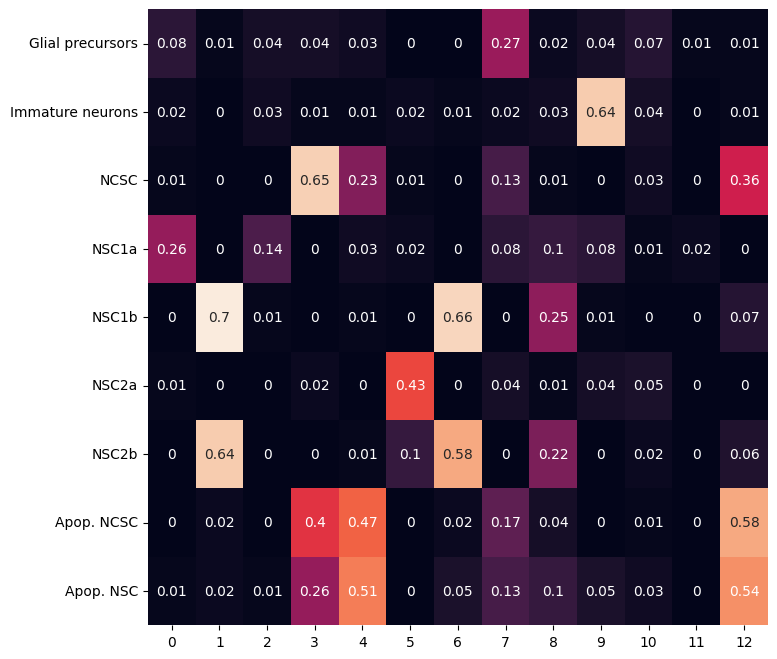

In [66]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_res0_7', normalize='reference'), cbar=False, annot=True)

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_res0_7', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_res0_7', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_res0_7', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_res0_7', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_res0_7', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_res0_7', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_res0_7', use_raw=True)

In [68]:
adata.obs['leiden_res0_7'].value_counts()

leiden_res0_7
0     8178
1     4859
2     3705
3     2859
4     2277
5     2255
6     1972
7     1620
8     1512
9      940
10     350
11     196
12     120
Name: count, dtype: int64

In [69]:
adata.obs.groupby(by='leiden_res0_7')['phase'].value_counts()

leiden_res0_7  phase
0              S        4193
               G1       3231
               G2M       754
1              G2M      3889
               S         960
               G1         10
2              G1       1940
               S        1210
               G2M       555
3              G2M      1208
               S        1028
               G1        623
4              G2M       905
               S         886
               G1        486
5              G1       1428
               S         467
               G2M       360
6              G2M      1944
               S          19
               G1          9
7              G1       1135
               S         340
               G2M       145
8              S         771
               G2M       725
               G1         16
9              G1        752
               G2M       130
               S          58
10             G2M       131
               S         121
               G1         98
11             G2M    

Annotation:

Separation in clusters 0, 6, 11 more based on cell cycle effects now.


### Add cell type annotations


In [101]:
tmp = []
for cell in adata.obs_names:
    if  adata.obs['leiden_res0_5'][cell] == '8':
        tmp.append('Glial precursors')
    elif adata.obs['leiden_res0_5'][cell] == '4':
        tmp.append('Apop. NSC') 
    elif adata.obs['leiden_res0_5'][cell] == '6':
        tmp.append('Immature neurons') 
    elif adata.obs['leiden_res0_5'][cell] == '9':
        tmp.append('Apop. NCSC') 
    elif adata.obs['leiden_res0_5'][cell] == '3':
        tmp.append('NCSC') 
    elif adata.obs['leiden_res0_5'][cell] == '5':
        tmp.append('NSC2') 
    elif adata.obs['leiden_res0_5'][cell] == '1':
        tmp.append('NSC (G2M)') 
    elif adata.obs['leiden_res0_7'][cell] == '6':
        tmp.append('NSC (G2M)') 
    elif adata.obs['leiden_res0_5'][cell] == '0':
        tmp.append('NSC1') 
    elif adata.obs['leiden_res0_5'][cell] == '2':
        tmp.append('NSC1') 
    elif adata.obs['leiden_res0_7'][cell] == '11':
        tmp.append('NSC1') 
    else:
        tmp.append(adata.obs['leiden_res0_1'][cell])
        
adata.obs['leiden_CC_cell_types'] = tmp

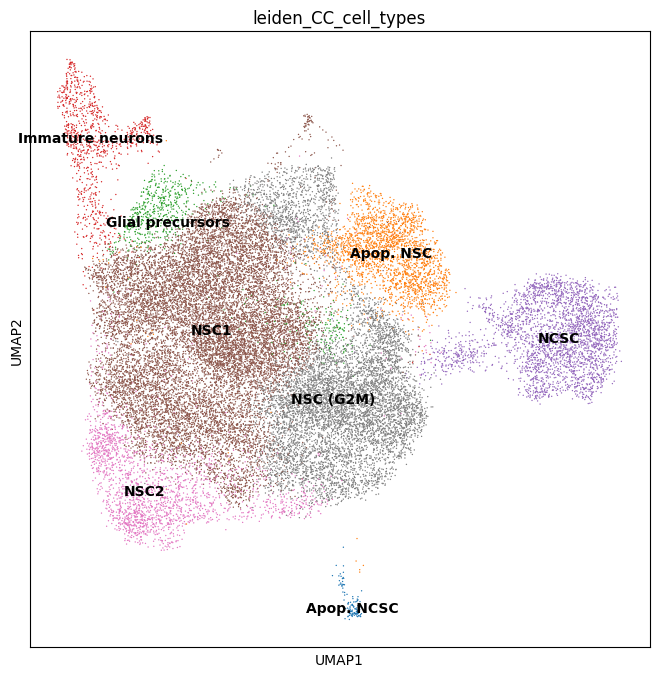

In [147]:
sc.pl.umap(adata, color=["leiden_CC_cell_types"], legend_loc="on data")

# Regress out cell cycle

In [73]:
adata

AnnData object with n_obs × n_vars = 30843 × 17250
    obs: 'Donor', 'lane', 'condition', 'age', 'years_of_illness', 'deltaHY', 'deltaUPDRS', 'deltaADL', 'deltaDOPA', 'gender', 'cultivation_period', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_score', 'size_factors', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden_res0_1', 'leiden_res0_2', 'leiden_res0_3', 'leiden_res0_5', 'leiden_res0_7', 'leiden_res0_8', 'leiden_res0_9', 'leiden_res1', 'leiden_CC_cell_types'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_symbols', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_genes', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly

In [74]:
#Data preparation
scvi.model.SCVI.setup_anndata(adata, layer="soupX_counts", batch_key=donor_key, continuous_covariate_keys = ['S_score', 'G2M_score'])
adata

AnnData object with n_obs × n_vars = 30843 × 17250
    obs: 'Donor', 'lane', 'condition', 'age', 'years_of_illness', 'deltaHY', 'deltaUPDRS', 'deltaADL', 'deltaDOPA', 'gender', 'cultivation_period', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_score', 'size_factors', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden_res0_1', 'leiden_res0_2', 'leiden_res0_3', 'leiden_res0_5', 'leiden_res0_7', 'leiden_res0_8', 'leiden_res0_9', 'leiden_res1', 'leiden_CC_cell_types'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_symbols', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_genes', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly

In [75]:
#Building the model
model_scvi = scvi.model.SCVI(adata, n_layers=2, n_latent=30)
model_scvi

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [76]:
#Print description of the model
model_scvi.view_anndata_setup()

Anndata setup with scvi-tools version 1.1.2.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'soupX_counts',
│   'batch_key': 'Donor',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': ['S_score', 'G2M_score']
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │  12   │
│         n_cells          │ 30843 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   2   │
│         n_labels         │   1   │
│          n_vars          │ 17250 │
└──────────────────────────┴───────┘

                            Data Registry                            
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃     Registry Key      ┃            scvi-tools Location            ┃
┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X           │       adata.layers['soupX_counts']        │
│         batch         │         adata.obs['_scvi_batch']          │
│ extra_continuous_covs │ adata.obsm['_scvi_extra_continuous_covs'] │
│        labels         │         adata.obs['_scvi_labels']         │
└───────────────────────┴───────────────────────────────────────────┘

                     batch State Registry                     
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃   Categories    ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Donor'] │ UKERi1E4-R1-003 │          0          │
│                    │ UKERi1JF-R1-018 │          1          │
│                    │ UKERi82A-R1-002 │          2          │
│                    │ UKERi88H-R1-002 │          3          │
│                    │ UKERiAY6-R1-003 │          4          │
│                    │ UKERiC99-R1-007 │          5          │
│                    │ UKERiG3G-R1-039 │          6          │
│                    │ UKERiJ2C-R1-015 │          7          │
│                    │ UKERiM89-R1-005 │          8          │
│                    │ UKERiO3H-R1-005 │          9          │
│                    │ UKERiPX7-R1-001 │         10          │
│                    │ UKERiR66-R1-007 │         11          │
└────────────────────┴─────────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

  extra_continuous_covs   
      State Registry      
┏━━━━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location     ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━┩
│  adata.obs['S_score']  │
│ adata.obs['G2M_score'] │
└────────────────────────┘

In [77]:
torch.set_float32_matmul_precision('medium')
scvi.settings.dl_num_workers = 15

In [78]:
model_scvi.train(check_val_every_n_epoch=1)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 259/259: 100%|██████| 259/259 [24:59<00:00,  6.02s/it, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.16e+4]

`Trainer.fit` stopped: `max_epochs=259` reached.


Epoch 259/259: 100%|██████| 259/259 [24:59<00:00,  5.79s/it, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.16e+4]


In [79]:
model_scvi.save('lp_NPCs/processed_data/model_scvi_noCC', overwrite=True)

In [80]:
#Extract embeddings
adata.obsm["X_scVI_noCC"] = model_scvi.get_latent_representation()

In [81]:
#Calculate bath-corrected UMAP
sc.pp.neighbors(adata, use_rep="X_scVI_noCC")
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


In [82]:
adata.uns['neighbors_noCC'] = adata.uns['neighbors']
adata.obsp['distances_noCC'] = adata.obsp['distances']
adata.obsp['connectivities_noCC'] = adata.obsp['connectivities']
adata.obsm['X_umap_noCC'] = adata.obsm['X_umap']

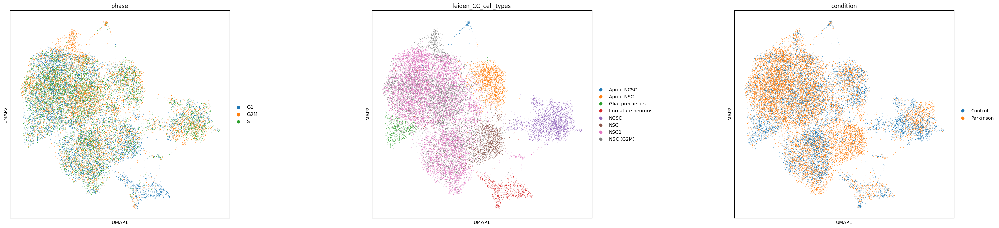

In [83]:
sc.pl.umap(adata, color=['phase', 'leiden_CC_cell_types' , label_key], ncols=3, wspace = 0.5)

# Clustering noCC

## Clustering

In [84]:
adata.uns['neighbors'] = adata.uns['neighbors_noCC']
adata.obsp['distances'] = adata.obsp['distances_noCC']
adata.obsp['connectivities'] = adata.obsp['connectivities_noCC']
adata.obsm['X_umap'] = adata.obsm['X_umap_noCC']

In [85]:
sc.tl.leiden(adata, key_added="leiden_noCC_res0_05", resolution=0.05)
sc.tl.leiden(adata, key_added="leiden_noCC_res0_1", resolution=0.1)
sc.tl.leiden(adata, key_added="leiden_noCC_res0_15", resolution=0.15)
sc.tl.leiden(adata, key_added="leiden_noCC_res0_2", resolution=0.2)
sc.tl.leiden(adata, key_added="leiden_noCC_res0_3", resolution=0.3)
sc.tl.leiden(adata, key_added="leiden_noCC_res0_5", resolution=0.5)

running Leiden clustering
    finished: found 2 clusters and added
    'leiden_noCC_res0_05', the cluster labels (adata.obs, categorical) (0:00:09)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_noCC_res0_1', the cluster labels (adata.obs, categorical) (0:00:10)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_noCC_res0_15', the cluster labels (adata.obs, categorical) (0:00:16)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_noCC_res0_2', the cluster labels (adata.obs, categorical) (0:00:21)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_noCC_res0_3', the cluster labels (adata.obs, categorical) (0:00:19)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_noCC_res0_5', the cluster labels (adata.obs, categorical) (0:00:17)


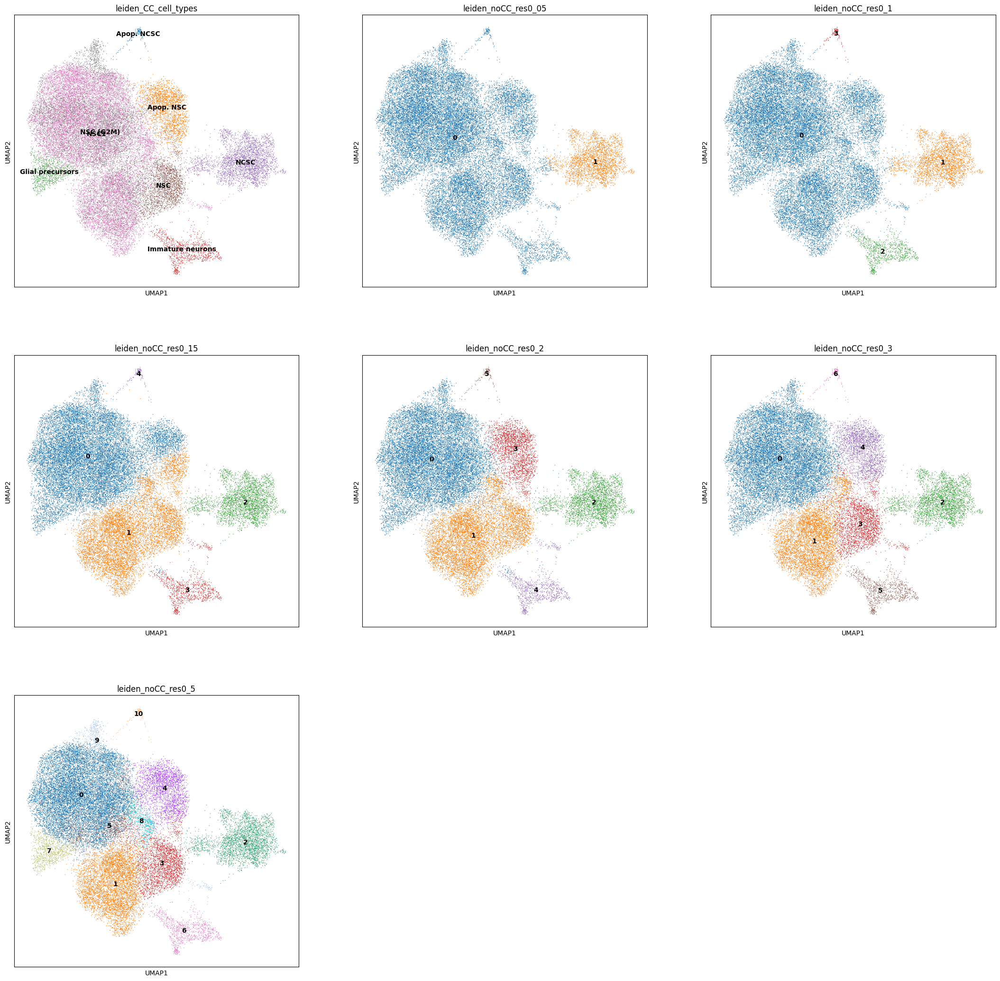

In [86]:
sc.pl.umap(adata, color=['leiden_CC_cell_types', 'leiden_noCC_res0_05', "leiden_noCC_res0_1", "leiden_noCC_res0_15", 'leiden_noCC_res0_2', 'leiden_noCC_res0_3', 'leiden_noCC_res0_5'], ncols=3, legend_loc="on data")

In [ ]:
sc.pl.umap(adata, color=['total_counts', "pct_counts_mt", "phase"], legend_loc="on data")

## Expression of interesting genes

In [ ]:
sc.pl.umap(adata, size=10, color=genes, ncols=4, title=genes+[''], use_raw=True, vmin=0, vmax="p99", sort_order=False, frameon=False, cmap="Reds")

## Marker genes

### Calculate marker genes

In [89]:
sc.tl.rank_genes_groups(adata, groupby='leiden_noCC_res0_05', key_added='rank_genes_leiden_noCC_res0_05', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_noCC_res0_1', key_added='rank_genes_leiden_noCC_res0_1', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_noCC_res0_15', key_added='rank_genes_leiden_noCC_res0_15', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_noCC_res0_2', key_added='rank_genes_leiden_noCC_res0_2', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_noCC_res0_3', key_added='rank_genes_leiden_noCC_res0_3', use_raw=True, method='wilcoxon')
sc.tl.rank_genes_groups(adata, groupby='leiden_noCC_res0_5', key_added='rank_genes_leiden_noCC_res0_5', use_raw=True, method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_leiden_noCC_res0_05']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:14)
ranking genes
    finished: added to `.uns['rank_genes_leiden_noCC_res0_1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:17)
ranking genes
    finished: added to `.uns['rank_genes_leiden_noCC_res0_15']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfo

### leiden_noCC res 0.1


In [90]:
pd.DataFrame(adata.uns['rank_genes_leiden_noCC_res0_1']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_noCC_res0_1.csv')

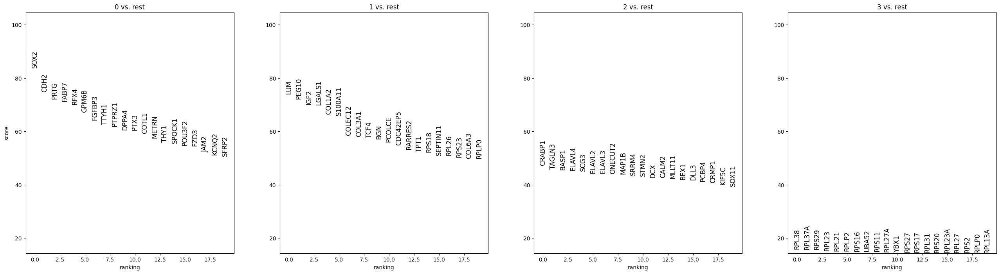

In [91]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_noCC_res0_1', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_noCC_res0_1']`


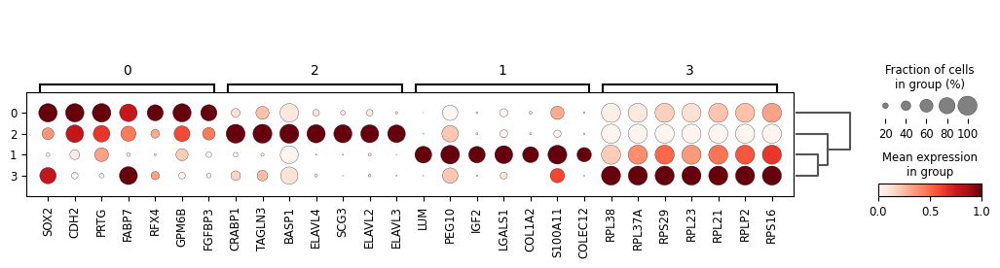

In [92]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_res0_1", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_res0_1")

In [93]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_noCC_res0_1", key_added="rank_genes_leiden_noCC_res0_1_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


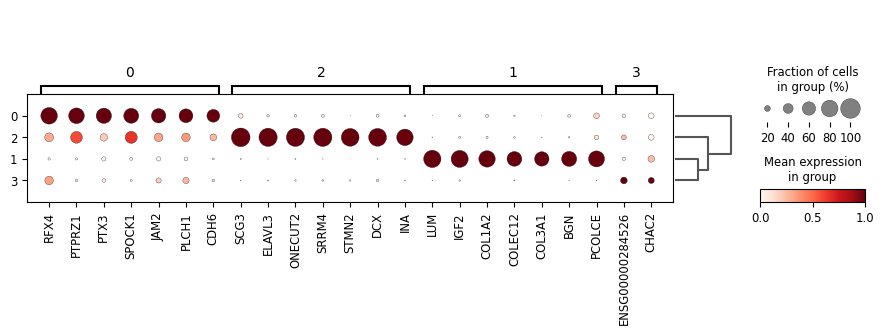

In [94]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_res0_1", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_res0_1_filtered")

In [ ]:
sc.pl.umap(adata, color=["leiden_noCC_res0_1"], legend_loc="on data")

<Axes: >

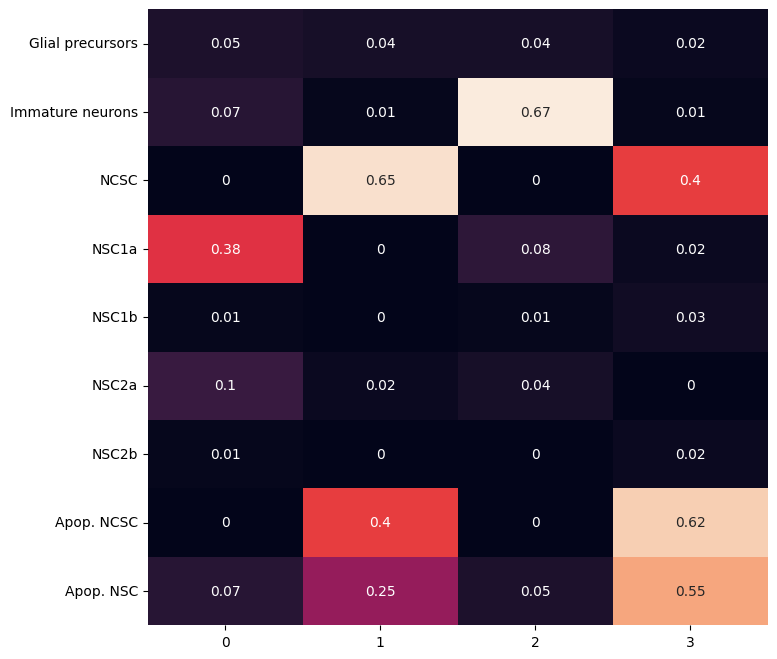

In [96]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_noCC_res0_1', normalize='reference'), cbar=False, annot=True)

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_noCC_res0_1', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_noCC_res0_1', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_noCC_res0_1', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_noCC_res0_1', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_noCC_res0_1', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_noCC_res0_1', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_noCC_res0_1', use_raw=True)

Annotation:

Cluster 0: NSC
- High expression of classical NSC marker such as SOX2

Cluster 1: NCSC
-  High expression of LUM, LGALS1, and a high fraction of ribosome and extracellular matrix constituents

Cluster 2: Immature neurons
- High expression of neuronal genes DCX, MAP2, TUBB3

Cluster 3: Apop. NCSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- low levels of BCL2, high levels of BAX
- More Apop. NCSC or NSC?

Plotting of marker genes indicates that cluster 0 contains both NSC1 (DAAM1, FABP7, PTCH1, and DLL1), NSC2 (SHH, FOXA2), as well as glial precursors (S100B, SOX10), and some Apop. cells (low BCL2, high BAX, and low mt counts). 
Further subclustering is necessary.

In [98]:
#adata.rename_categories('leiden_noCC_res0_1', ['NSC1', 'NSC2', 'NCSC', 'Apop. cells', 'Glial precursors', 'Immature neurons'])

In [99]:
adata.obs['leiden_noCC_res0_1'].value_counts()

leiden_noCC_res0_1
0    27076
1     2824
2      842
3      101
Name: count, dtype: int64

In [100]:
pd.crosstab(adata.obs['leiden_res0_2'], adata.obs['leiden_noCC_res0_1'])

leiden_noCC_res0_1,0,1,2,3
leiden_res0_2,,,,
0,17346,195,18,0
1,7391,9,2,0
2,56,2615,1,0
3,2166,2,4,0
4,96,2,817,0
5,21,1,0,101


### leiden_noCC res 0.2


In [103]:
pd.DataFrame(adata.uns['rank_genes_leiden_noCC_res0_2']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_noCC_res0_2.csv')

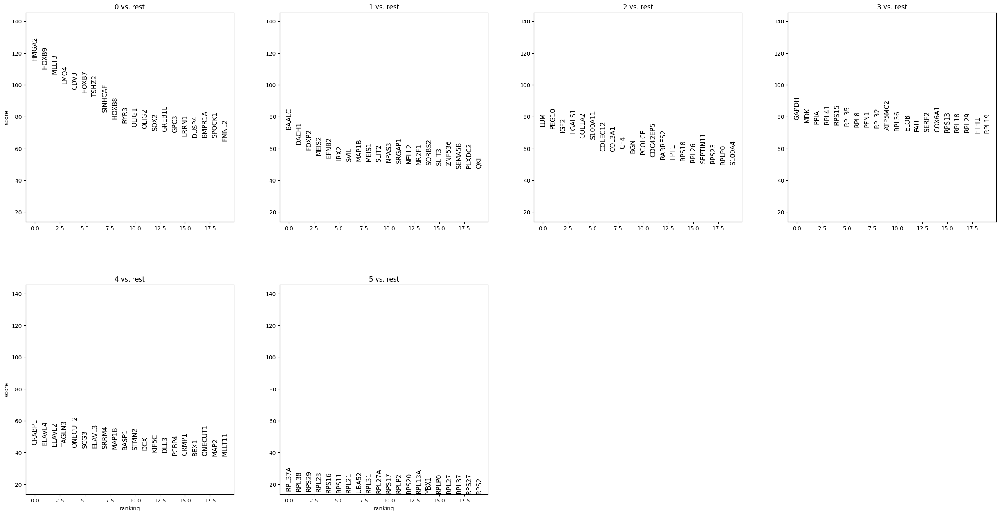

In [104]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_noCC_res0_2', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_noCC_res0_2']`


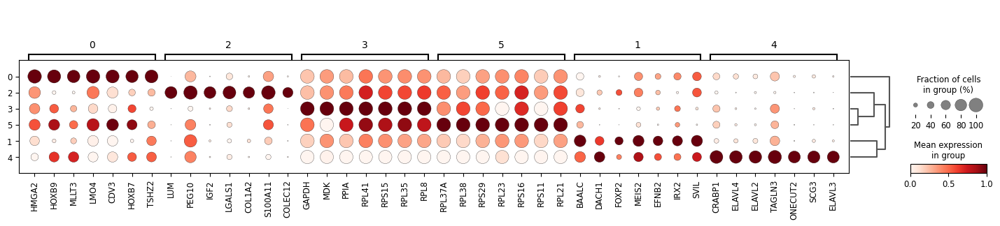

In [105]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_res0_2", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_res0_2")

In [106]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_noCC_res0_2", key_added="rank_genes_leiden_noCC_res0_2_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


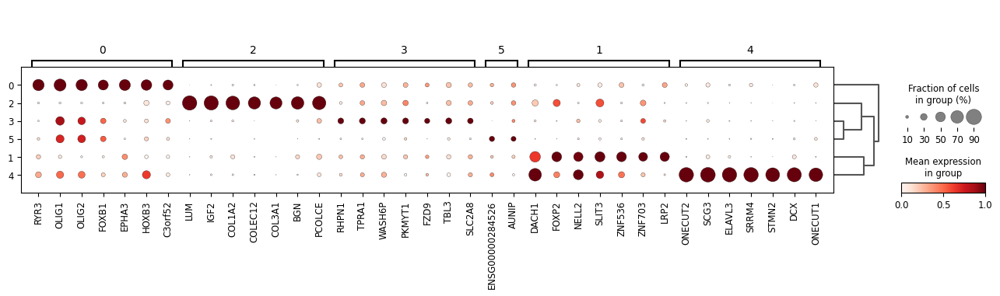

In [107]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_res0_2", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_res0_2_filtered")

In [ ]:
sc.pl.umap(adata, color=["leiden_noCC_res0_2"], legend_loc="on data")

<Axes: >

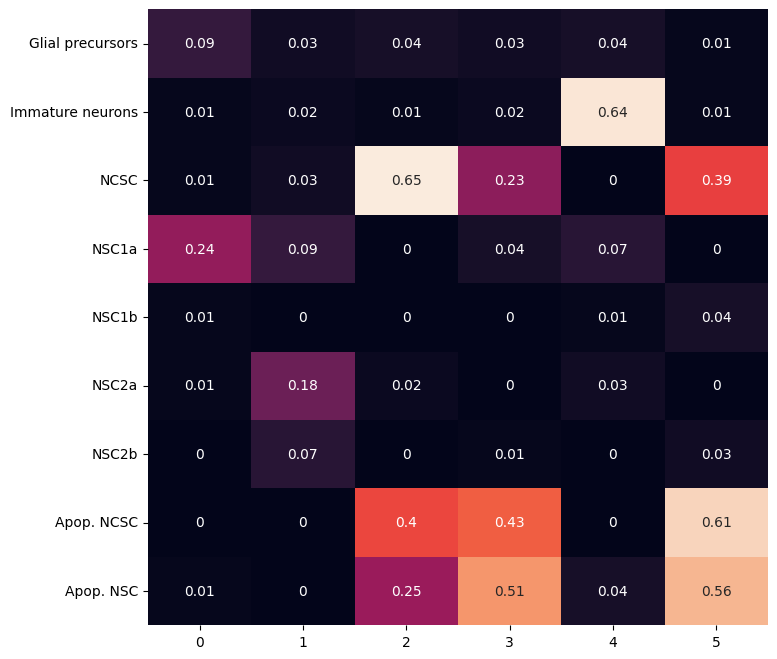

In [109]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_noCC_res0_2', normalize='reference'), cbar=False, annot=True)

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_noCC_res0_2', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_noCC_res0_2', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_noCC_res0_2', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_noCC_res0_2', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_noCC_res0_2', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_noCC_res0_2', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_noCC_res0_2', use_raw=True)

In [111]:
adata.obs['leiden_noCC_res0_2'].value_counts()

leiden_noCC_res0_2
0    16140
1     8396
2     2863
3     2388
4      942
5      114
Name: count, dtype: int64

### leiden_noCC res 0.3


In [112]:
pd.DataFrame(adata.uns['rank_genes_leiden_noCC_res0_3']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_noCC_res0_3.csv')

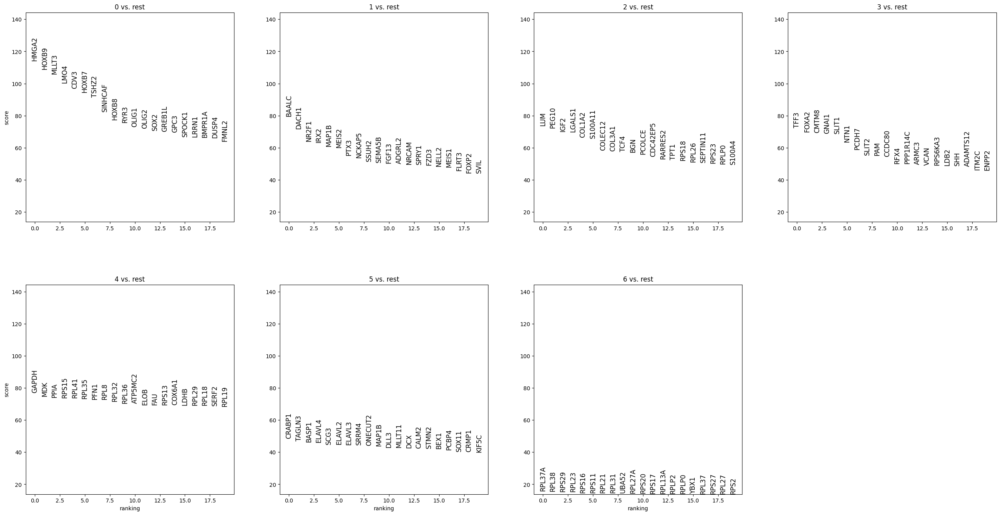

In [113]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_noCC_res0_3', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_noCC_res0_3']`


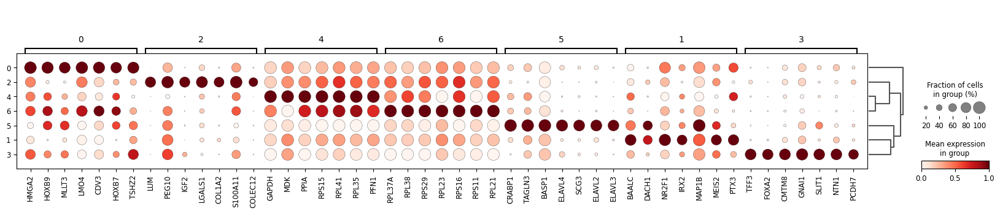

In [114]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_res0_3", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_res0_3")

In [115]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_noCC_res0_3", key_added="rank_genes_leiden_noCC_res0_3_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


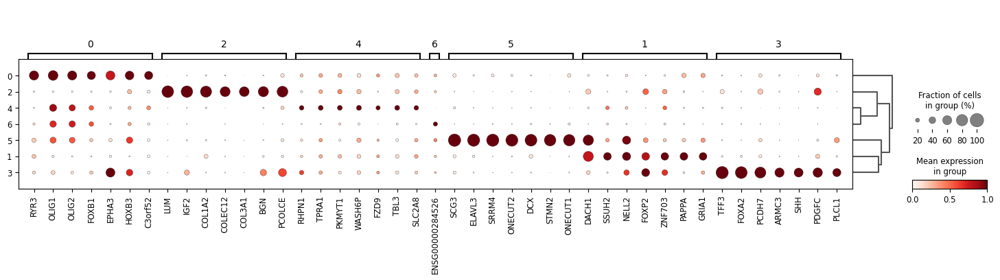

In [116]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_res0_3", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_res0_3_filtered")

In [ ]:
sc.pl.umap(adata, color=["leiden_noCC_res0_3"], legend_loc="on data")

<Axes: >

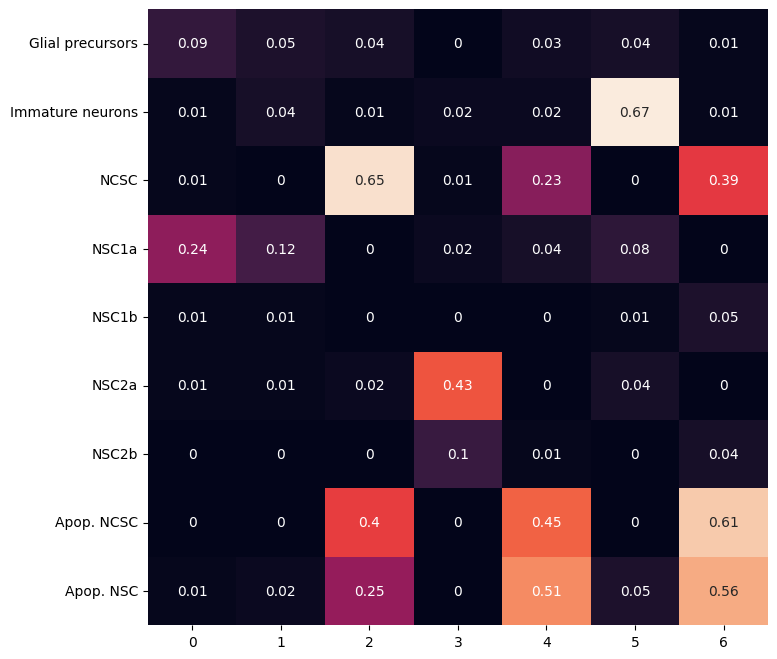

In [118]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_noCC_res0_3', normalize='reference'), cbar=False, annot=True)

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_noCC_res0_3', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_noCC_res0_3', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_noCC_res0_3', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_noCC_res0_3', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_noCC_res0_3', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_noCC_res0_3', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_noCC_res0_3', use_raw=True)

In [120]:
adata.obs['leiden_noCC_res0_3'].value_counts()

leiden_noCC_res0_3
0    15872
1     6168
2     2859
3     2601
4     2321
5      907
6      115
Name: count, dtype: int64

Cluster 0,1: NSC1
- High expression of classical NSC marker such as SOX2
- High expression of DAAM1, FABP7, PTCH1, and DLL1
- Markers associated with Wnt signaling, neuron development and neuron projection development

Cluster 3: NSC2
- High expression of classical NSC2 marker such as SHH, FOXA2, and HES1
- Markers associated with primary cilium and neuron projection development + axon guidance
- High overlap of marker with established marker sets

Cluster 2: NCSC
-  High expression of LUM, LGALS1, and a high fraction of ribosome and extracellular matrix constituents
  
Cluster 5: Apop. NSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- Pathways associated with mitophagy (PINK1, PRKN mediated)
- Many mt and rb associated markers
- low levels of BCL2, high levels of BAX
- Higher overlap of marker with established marker sets Apop. NSC
  
Cluster 5: Immature neurons
- High expression of neuronal genes DCX, MAP2, TUBB3
- Pathways asociated with neuronal differentiation, midbrain development, neurotransmitter (e.g. dopamine) release

Cluster 6: Apop. NCSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- Pathways associated with mitophagy (PINK1, PRKN mediated)
- Many mt and rb associated markers
- low levels of BCL2, high levels of BAX
- Higher overlap of marker with established marker sets Apop. NCSC
  
NSC cluster still contains some Glial precursors. Further subclustering necessary.

### leiden_noCC res 0.5


In [121]:
pd.DataFrame(adata.uns['rank_genes_leiden_noCC_res0_5']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_noCC_res0_5.csv')

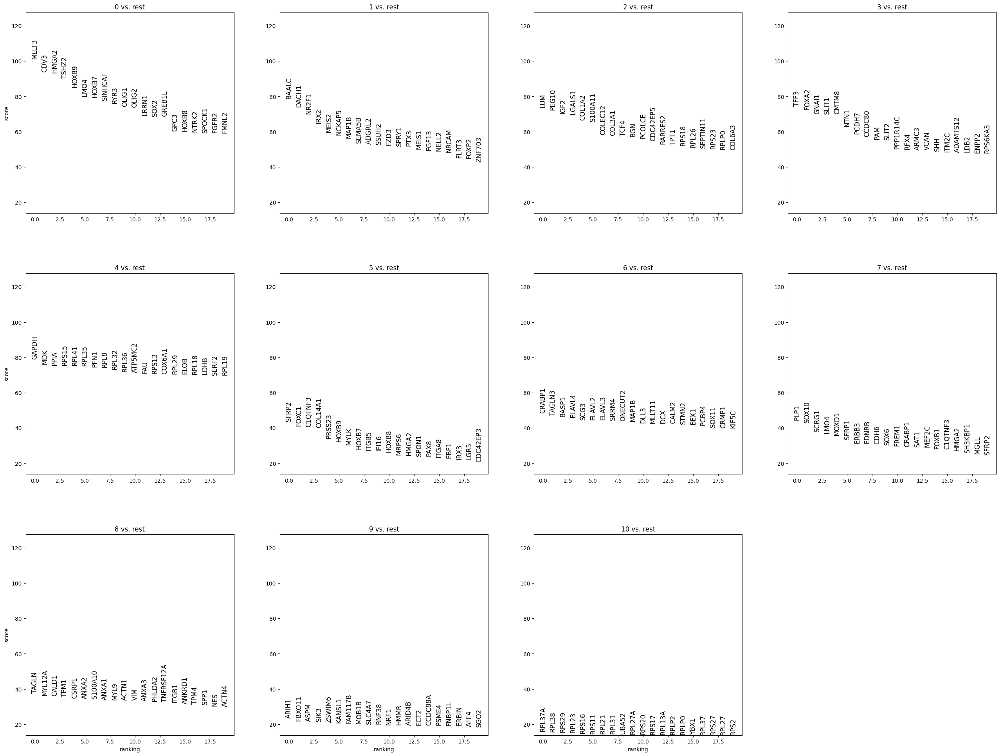

In [122]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_noCC_res0_5', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_noCC_res0_5']`


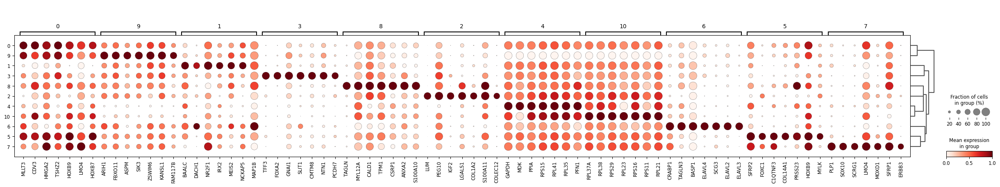

In [123]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_res0_5", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_res0_5")

In [124]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_noCC_res0_5", key_added="rank_genes_leiden_noCC_res0_5_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


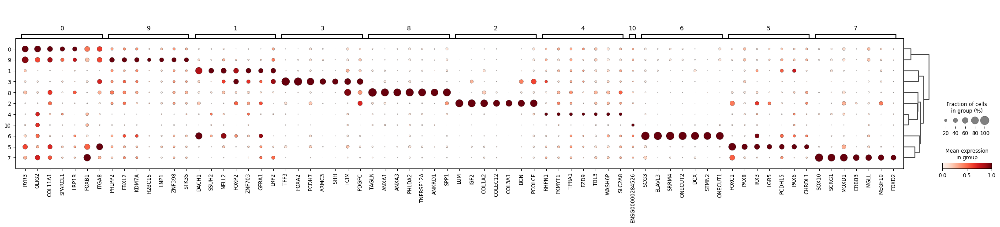

In [125]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_res0_5", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_res0_5_filtered")

In [ ]:
sc.pl.umap(adata, color=["leiden_noCC_res0_5"], legend_loc="on data")

<Axes: >

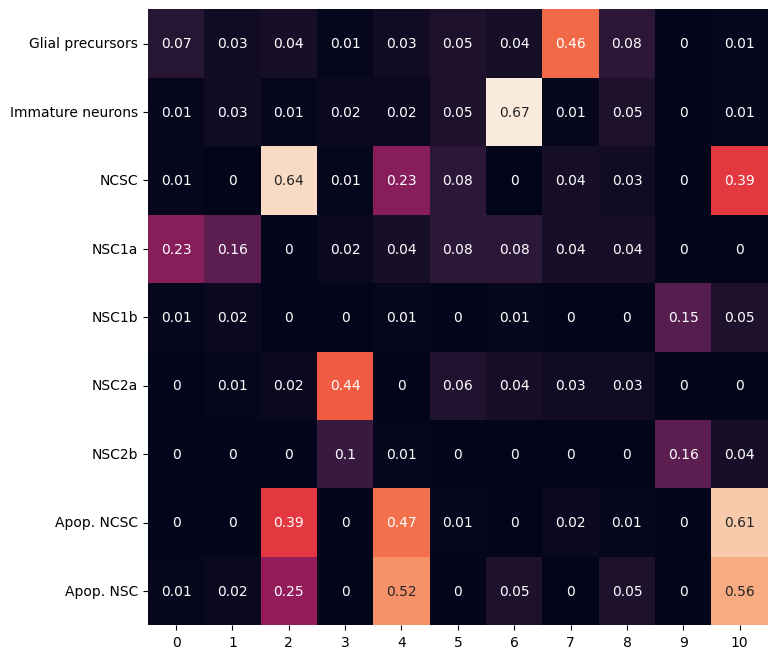

In [127]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_noCC_res0_5', normalize='reference'), cbar=False, annot=True)

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_noCC_res0_5', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_noCC_res0_5', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_noCC_res0_5', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_noCC_res0_5', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_noCC_res0_5', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_noCC_res0_5', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_noCC_res0_5', use_raw=True)

Cluster 0,1,5,8,9: NSC1
- High expression of classical NSC marker such as SOX2
- High expression of DAAM1, FABP7, PTCH1, and DLL1
- Markers associated with Wnt signaling, neuron development and neuron projection development

Cluster 3: NSC2
- High expression of classical NSC2 marker such as SHH, FOXA2, and HES1
- Markers associated with primary cilium and neuron projection development + axon guidance
- High overlap of marker with established marker sets

Cluster 2: NCSC
-  High expression of LUM, LGALS1, and a high fraction of ribosome and extracellular matrix constituents
  
Cluster 4: Apop. NSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- Pathways associated with mitophagy (PINK1, PRKN mediated)
- Many mt and rb associated markers
- low levels of BCL2, high levels of BAX
- Higher overlap of marker with established marker sets Apop. NSC
  
Cluster 6: Immature neurons
- High expression of neuronal genes DCX, MAP2, TUBB3
- Pathways asociated with neuronal differentiation, midbrain development, neurotransmitter (e.g. dopamine) release

Cluster 7: Glial precursors
- High expression of glial markers such as SOX10 and S100B

Cluster 10: Apop. NCSC
- Low mitochondrial fraction, active cell death signaling and nonspecific marker genes
- Pathways associated with mitophagy (PINK1, PRKN mediated)
- Many mt and rb associated markers
- low levels of BCL2, high levels of BAX
- Higher overlap of marker with established marker sets Apop. NCSC
  
Further subclustering of the NSC1 cluster did not produce cluster with biological relevance.
Merging cluster 0,1,5,8,9

In [129]:
adata.obs['leiden_noCC_res0_5'].value_counts()

leiden_noCC_res0_5
0     12965
1      5705
2      2860
3      2661
4      2481
5      1133
6       910
7       896
8       599
9       518
10      115
Name: count, dtype: int64

## Isolate meaningful NSC clusters, merge remaining NSC1 clusters


In [130]:
tmp = []
for cell in adata.obs_names:
    if  adata.obs['leiden_noCC_res0_5'][cell] == '0':
        tmp.append('NSC1')
    elif  adata.obs['leiden_noCC_res0_5'][cell] == '1':
        tmp.append('NSC1')
    elif  adata.obs['leiden_noCC_res0_5'][cell] == '5':
        tmp.append('NSC1')
    elif  adata.obs['leiden_noCC_res0_5'][cell] == '8':
        tmp.append('NSC1')
    elif  adata.obs['leiden_noCC_res0_5'][cell] == '9':
        tmp.append('NSC1')
    elif adata.obs['leiden_noCC_res0_5'][cell] == '3':
        tmp.append('NSC2')
    elif adata.obs['leiden_noCC_res0_5'][cell] == '2':
        tmp.append('NCSC')
    elif adata.obs['leiden_noCC_res0_5'][cell] == '4':
        tmp.append('Apop. NSC')
    elif adata.obs['leiden_noCC_res0_5'][cell] == '6':
        tmp.append('Immature neurons')
    elif adata.obs['leiden_noCC_res0_5'][cell] == '7':
        tmp.append('Glial precursors')
    elif adata.obs['leiden_noCC_res0_5'][cell] == '10':
        tmp.append('Apop. NCSC')    
    else:
        tmp.append(adata.obs['leiden_noCC_res0_5'][cell])
        
adata.obs['leiden_noCC_cell_types'] = tmp


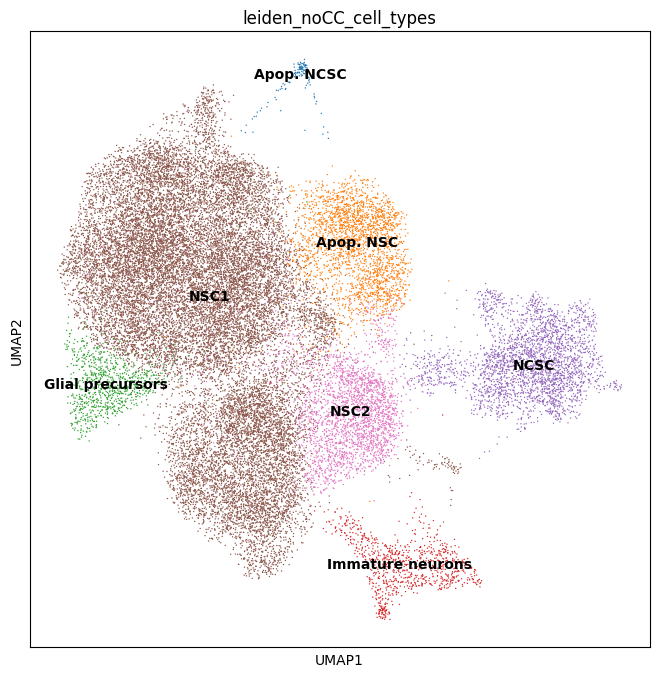

In [131]:
sc.pl.umap(adata, color=["leiden_noCC_cell_types"], legend_loc="on data")

In [133]:
sc.tl.rank_genes_groups(adata, groupby='leiden_noCC_cell_types', key_added='rank_genes_leiden_noCC_cell_types', use_raw=True, method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_leiden_noCC_cell_types']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:19)


In [134]:
pd.DataFrame(adata.uns['rank_genes_leiden_noCC_cell_types']['names']).head(100).to_csv('lp_NPCs/marker_genes/rank_genes_leiden_noCC_cell_types.csv')

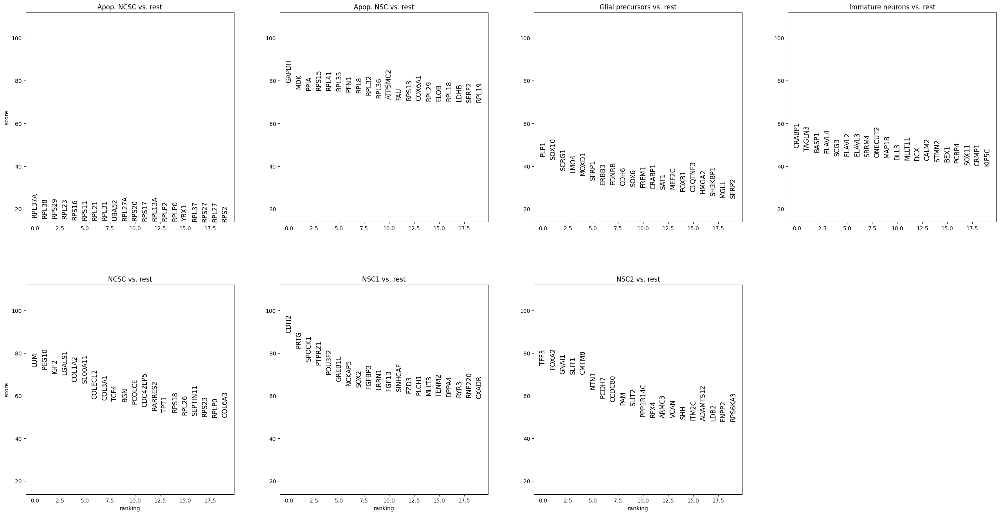

In [135]:
#Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_leiden_noCC_cell_types', fontsize=12)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_noCC_cell_types']`


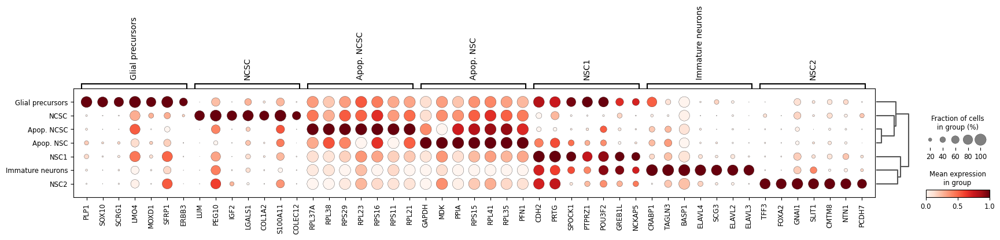

In [136]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_cell_types", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_cell_types")

In [137]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2, key="rank_genes_leiden_noCC_cell_types", key_added="rank_genes_leiden_noCC_cell_types_filtered")

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 1, max_out_group_fraction: 0.2


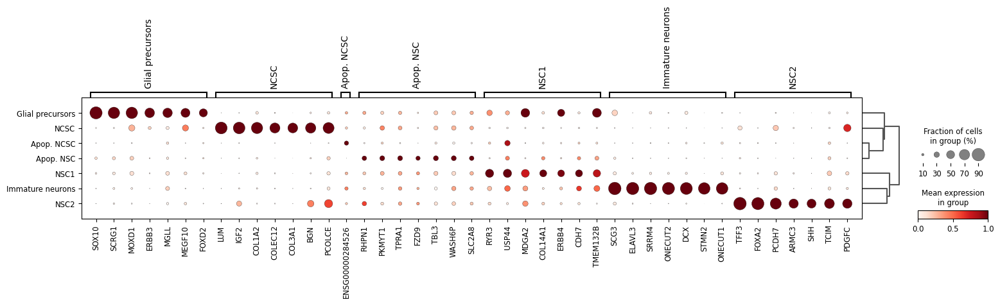

In [138]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_noCC_cell_types", standard_scale="var", n_genes=7, key="rank_genes_leiden_noCC_cell_types_filtered")

<Axes: >

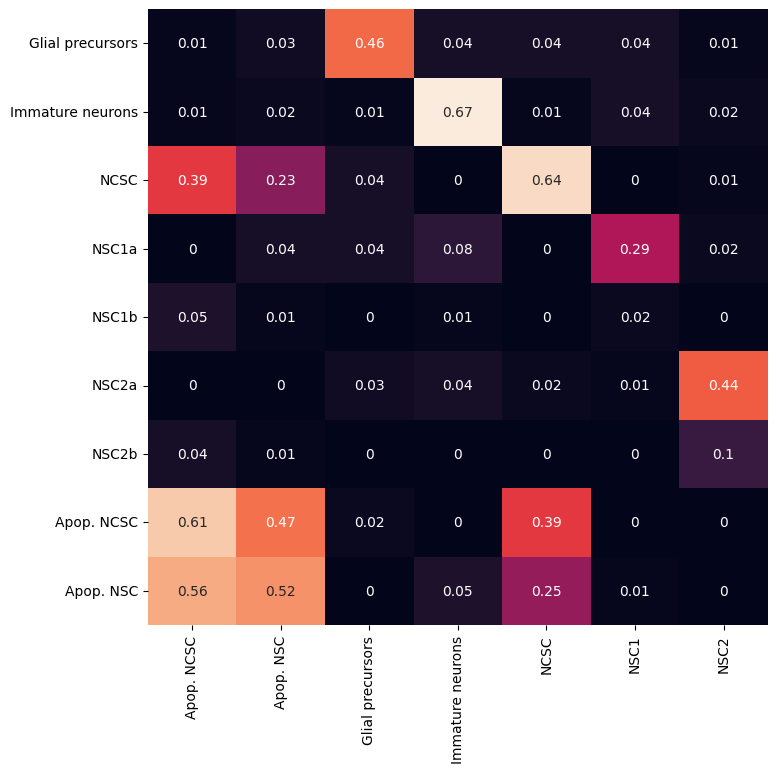

In [139]:
#Overlap with newer marker gene sets
sb.heatmap(sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_leiden_noCC_cell_types', normalize='reference'), cbar=False, annot=True)

In [140]:
adata.obs['leiden_noCC_cell_types'].value_counts()

leiden_noCC_cell_types
NSC1                20920
NCSC                 2860
NSC2                 2661
Apop. NSC            2481
Immature neurons      910
Glial precursors      896
Apop. NCSC            115
Name: count, dtype: int64

In [ ]:
sc.pl.violin(adata, 'FOXA2', groupby='leiden_noCC_cell_types', use_raw=True)
sc.pl.violin(adata, 'SHH', groupby='leiden_noCC_cell_types', use_raw=True)
sc.pl.violin(adata, 'PTCH1', groupby='leiden_noCC_cell_types', use_raw=True)
sc.pl.violin(adata, 'SOX10', groupby='leiden_noCC_cell_types', use_raw=True)
sc.pl.violin(adata, 'S100B', groupby='leiden_noCC_cell_types', use_raw=True)
sc.pl.violin(adata, 'BCL2', groupby='leiden_noCC_cell_types', use_raw=True)
sc.pl.violin(adata, 'BAX', groupby='leiden_noCC_cell_types', use_raw=True)

In [142]:
adata.obs.groupby(by='leiden_noCC_cell_types')['condition'].value_counts()

leiden_noCC_cell_types  condition
Apop. NCSC              Parkinson       58
                        Control         57
Apop. NSC               Control       1283
                        Parkinson     1198
Glial precursors        Control        646
                        Parkinson      250
Immature neurons        Parkinson      482
                        Control        428
NCSC                    Control       1663
                        Parkinson     1197
NSC1                    Parkinson    13550
                        Control       7370
NSC2                    Parkinson     2410
                        Control        251
Name: count, dtype: int64

## Cell death analysis

In [143]:
cell_death_markers = dict()
cell_death_markers['Ferroptosis_pos'] = ['VDAC2', 'VDAC3', 'NRAS', 'KRAS', 'NOX1', 'NOX4', 'NOX5', 'TFRC', 'TP53', 'CARS', 'ACSL4']
cell_death_markers['Ferroptosis_neg'] = ['GPX4', 'SLC7A11', 'HSPB1', 'NFE2L2']
cell_death_markers['Apoptosis_pos'] = ['TP53', 'BAX', 'BAK1'] #other pro apoptotic BCL2 family members
cell_death_markers['Apoptosis_neg'] = ['BCL2', 'BCL2L1', 'MCL1'] #other anti apoptotic BCL2 family members
cell_death_markers['Necroptosis_pos'] = ['RIPK1', 'RIPK3', 'MLKL']
cell_death_markers['Autophagy_pos'] = ['ATG5', 'ATG7', 'BECN1'] #other ATG family proteins
cell_death_markers['Pathanatos_pos'] = ['AIFM1', 'PARP1']

In [ ]:
for cd_type in cell_death_markers:
    if len(set(cell_death_markers[cd_type]).intersection(set(adata.var_names))) < 2:
        print(f'{cd_type} score cannot be calculated as there are insufficient markers in the dataset')
    else:
        sc.tl.score_genes(adata, cell_death_markers[cd_type], score_name=cd_type+'_corr', use_raw=True)
        
        sc.pl.umap(adata, color=cd_type+'_corr', size=10, vmin=0, vmax="p99", sort_order=False, frameon=False, cmap="Reds")
        sc.pl.violin(adata, cd_type+'_corr', groupby='leiden_noCC_cell_types')

# Merge labels from CC and noCC clustering

In [145]:
adata.uns['neighbors'] = adata.uns['neighbors_CC']
adata.obsp['distances'] = adata.obsp['distances_CC']
adata.obsp['connectivities'] = adata.obsp['connectivities_CC']
adata.obsm['X_umap'] = adata.obsm['X_umap_CC']

In [ ]:
sc.pl.umap(adata, color=['leiden_CC_cell_types', 'leiden_noCC_cell_types', 'phase'], wspace = 0.5)

Keep refined clusters from the noCC approach. Subcluster NSC clusters for cell cycle phases.

In [148]:
adata.obs['leiden_CC_cell_types'].value_counts()

leiden_CC_cell_types
NSC1                14082
NSC (G2M)            7708
NCSC                 2854
Apop. NSC            2234
NSC2                 2170
Immature neurons      951
Glial precursors      727
Apop. NCSC            117
Name: count, dtype: int64

In [149]:
adata.obs['leiden_noCC_cell_types'].value_counts()

leiden_noCC_cell_types
NSC1                20920
NCSC                 2860
NSC2                 2661
Apop. NSC            2481
Immature neurons      910
Glial precursors      896
Apop. NCSC            115
Name: count, dtype: int64

In [150]:
pd.crosstab(adata.obs['leiden_CC_cell_types'], adata.obs['leiden_noCC_cell_types'])

leiden_noCC_cell_types,Apop. NCSC,Apop. NSC,Glial precursors,Immature neurons,NCSC,NSC1,NSC2
leiden_CC_cell_types,,,,,,,
Apop. NCSC,111,0,0,0,0,5,1
Apop. NSC,4,2092,4,5,5,62,62
Glial precursors,0,10,648,0,1,68,0
Immature neurons,0,6,0,862,3,79,1
NCSC,0,2,4,1,2797,18,32
NSC1,0,202,110,20,23,13497,230
NSC2,0,7,0,0,10,251,1902
NSC (G2M),0,162,130,22,21,6940,433


In [151]:
tmp = []
for cell in adata.obs_names:
    if  adata.obs['leiden_CC_cell_types'][cell] == 'NSC (G2M)':
        if  adata.obs['leiden_noCC_cell_types'][cell] == 'NSC2':
            tmp.append('NSC2b')
        elif adata.obs['leiden_noCC_cell_types'][cell] == 'NSC1':
            tmp.append('NSC1b')
        else:
            tmp.append(adata.obs['leiden_noCC_cell_types'][cell])
    
    else:
        tmp.append(adata.obs['leiden_noCC_cell_types'][cell])
        
adata.obs['cell_types'] = tmp
adata.obs['cell_types'] = adata.obs['cell_types'].astype('category')

In [ ]:
sc.pl.umap(adata, color=['cell_types'], legend_loc="on data")

In [153]:
adata.obs['cell_types'].cat.categories

Index(['Apop. NCSC', 'Apop. NSC', 'Glial precursors', 'Immature neurons',
       'NCSC', 'NSC1', 'NSC1b', 'NSC2', 'NSC2b'],
      dtype='object')

In [154]:
adata.rename_categories('cell_types', ['Apop. NCSC', 'Apop. NSC', 'Glial precursors', 'Immature neurons',
       'NCSC', 'NSC1a', 'NSC1b', 'NSC2a', 'NSC2b'])

In [155]:
adata.obs['cell_types'].value_counts()

cell_types
NSC1a               13980
NSC1b                6940
NCSC                 2860
Apop. NSC            2481
NSC2a                2228
Immature neurons      910
Glial precursors      896
NSC2b                 433
Apop. NCSC            115
Name: count, dtype: int64

In [ ]:
sc.pl.umap(adata, color=['cell_types', 'condition', 'Donor', 
                         'age', 'years_of_illness', 'deltaHY',
                         'deltaUPDRS', 'deltaADL', 'deltaDOPA', 
                         'gender', 'phase', 'lane'], ncols=3)

# Summary plots

In [ ]:
adata.obs['Donor'] = adata.obs['Donor'].cat.reorder_categories(['UKERi1JF-R1-018', 'UKERiG3G-R1-039', 'UKERi1E4-R1-003', 'UKERiO3H-R1-005', 
                                                  'UKERi82A-R1-002', 'UKERiJ2C-R1-015', 'UKERiM89-R1-005', 'UKERiC99-R1-007', 
                                                  'UKERiR66-R1-007', 'UKERiAY6-R1-003', 'UKERiPX7-R1-001', 'UKERi88H-R1-002'])

In [ ]:
adata.obs['cell_types'].cat.categories

In [30]:
col6 = ['#6a3d9a', #'Apop. NCSC'
'#ff7f00',#'Apop. NSC'
'#a6cee3',#'Glial precursors'
'#1f78b4',#'Immature neurons'
'#b2df8a',#'NCSC'
'#33a02c', #NSC1a
'#cab2d6', #NSC1b
'#e31a1c', #NSC2a
'#fdbf6f', #NSC2b
'#cab2d6'
]

In [31]:
adata.uns['cell_types_colors'] = col6

In [6]:
plt.rcParams['figure.figsize']=(6,6) #rescale figures

In [7]:
sc.set_figure_params(scanpy=True, dpi_save=300, figsize=(8,8), vector_friendly=True, format='svg',  transparent=True)

In [ ]:
sc.pl.umap(adata, color='cell_types', size=30, title="", frameon=False, save = '_CC_clustering.svg')

In [12]:
parameter_visualization = ['cell_types', 'lane', 'Donor',  
                           'total_counts', 'pct_counts_mt', 'pct_counts_ribo',
                           'phase', 'age', 'gender', 
                           'condition', 'years_of_illness', 'deltaHY', 
                           'deltaUPDRS', 'deltaADL', 'deltaDOPA']



In [ ]:
sc.pl.umap(adata, size=30, color=parameter_visualization, ncols=3, use_raw=True, sort_order=False, frameon=False, cmap="Reds", save='_CC_summary_plots.svg')

In [ ]:
sc.pl.umap(adata, size=30, color=parameter_visualization, ncols=3, use_raw=True, sort_order=False, frameon=False, save='_CC_summary_plots_othercolors.svg')

In [ ]:
alpha=0.5

sc.pl.umap(adata, color='cell_types', size=30, save='_CC_cell_types.svg', title="", frameon=False)
sc.pl.umap(adata, color='Donor', size=30, save='_CC_Donor.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='condition', size=30, save='_CC_condition.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='phase', size=30, save='_CC_phase.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='age', size=30, save='_CC_age.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='gender', size=30, save='_CC_gender.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='years_of_illness', size=30, save='_CC_years_of_illness.svg', title="", frameon=False)
sc.pl.umap(adata, color='deltaHY', size=30, save='_CC_deltaHY.svg', title="", frameon=False)
sc.pl.umap(adata, color='deltaUPDRS', size=30, save='_CC_deltaUPDRS.svg', title="", frameon=False)
sc.pl.umap(adata, color='deltaADL', size=30, save='_CC_deltaADL.svg', title="", frameon=False)
sc.pl.umap(adata, color='deltaDOPA', size=30, save='_CC_deltaDOPA.svg', title="", frameon=False)
sc.pl.umap(adata, color='total_counts', size=30, save='_CC_total_counts.svg', title="", frameon=False)
sc.pl.umap(adata, color='pct_counts_mt', size=30, save='_CC_pct_counts_mt.svg', title="", frameon=False)
sc.pl.umap(adata, color='pct_counts_ribo', size=30, save='_CC_pct_counts_ribo.svg', title="", frameon=False)


# Marker plots

In [5]:
genes =['SOX2', 'FABP7', 'DAAM1', 'PTCH1',
        'SOX2', 'SHH','FOXA2','HES1',
        'SOX10','S100B', 'DCX','MAP2',
        'BCL2','BAX','LUM','LGALS1',
        'CENPF','AURKB','CDC20']

In [20]:
# Abbreviate the cell annotations for plots
adata.obs['cell_types_abbrev'] = ['Glial prec.' if ct.startswith('Glial') else 'Imm. Neurons' if ct.startswith('Immature') else ct for ct in adata.obs['cell_types']]
adata.obs['cell_types_abbrev'] = adata.obs['cell_types_abbrev'].astype('category')

In [21]:
adata.obs['cell_types_abbrev'].cat.categories

Index(['Apop. NCSC', 'Apop. NSC', 'Glial prec.', 'Imm. Neurons', 'NCSC',
       'NSC1a', 'NSC1b', 'NSC2a', 'NSC2b'],
      dtype='object')

In [22]:
col6 = ['#6a3d9a', #'Apop. NCSC'
'#ff7f00',#'Apop. NSC'
'#a6cee3',#'Glial precursors'
'#1f78b4',#'Immature neurons'
'#b2df8a',#'NCSC'
'#33a02c', #NSC1a
'#cab2d6', #NSC1b
'#e31a1c', #NSC2a
'#fdbf6f', #NSC2b
'#cab2d6'
]

adata.uns['cell_types_abbrev_colors'] = col6


In [ ]:
sc.pl.umap(adata, size=30, color=genes+["cell_types_abbrev"], ncols=4, title=genes+[''], use_raw=False, vmin=0, vmax="p99", sort_order=False, frameon=False, cmap="Reds", save='_CC_marker_genes.svg')

In [ ]:
sc.pl.dotplot(adata, genes , groupby = 'cell_types', cmap= 'Reds', 
              mean_only_expressed = True, save = 'dotplot_markers.svg')

# Summary plots noCC

In [24]:
adata.uns['neighbors'] = adata.uns['neighbors_noCC']
adata.obsp['distances'] = adata.obsp['distances_noCC']
adata.obsp['connectivities'] = adata.obsp['connectivities_noCC']
adata.obsm['X_umap'] = adata.obsm['X_umap_noCC']

In [ ]:
sc.pl.umap(adata, color='cell_types', size=30, title="", frameon=False, save = '_noCC_clustering.svg')

In [ ]:
sc.pl.umap(adata, size=30, color=parameter_visualization, ncols=3, use_raw=True, sort_order=False, frameon=False, cmap="Reds", save='_noCC_summary_plots.svg')

In [ ]:
sc.pl.umap(adata, size=30, color=parameter_visualization, ncols=3, use_raw=True, sort_order=False, frameon=False, save='_noCC_summary_plots_othercolors.svg')

In [ ]:
alpha=0.5

sc.pl.umap(adata, color='cell_types', size=30, save='_noCC_cell_types.svg', title="", frameon=False)
sc.pl.umap(adata, color='Donor', size=30, save='_noCC_Donor.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='condition', size=30, save='_noCC_condition.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='phase', size=30, save='_noCC_phase.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='age', size=30, save='_noCC_age.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='gender', size=30, save='_noCC_gender.svg', title="", frameon=False, alpha=alpha)
sc.pl.umap(adata, color='years_of_illness', size=30, save='_noCC_years_of_illness.svg', title="", frameon=False)
sc.pl.umap(adata, color='deltaHY', size=30, save='_noCC_deltaHY.svg', title="", frameon=False)
sc.pl.umap(adata, color='deltaUPDRS', size=30, save='_noCC_deltaUPDRS.svg', title="", frameon=False)
sc.pl.umap(adata, color='deltaADL', size=30, save='_noCC_deltaADL.svg', title="", frameon=False)
sc.pl.umap(adata, color='deltaDOPA', size=30, save='_noCC_deltaDOPA.svg', title="", frameon=False)
sc.pl.umap(adata, color='total_counts', size=30, save='_noCC_total_counts.svg', title="", frameon=False)
sc.pl.umap(adata, color='pct_counts_mt', size=30, save='_noCC_pct_counts_mt.svg', title="", frameon=False)
sc.pl.umap(adata, color='pct_counts_ribo', size=30, save='_noCC_pct_counts_ribo.svg', title="", frameon=False)


# Marker plots noCC

In [ ]:
sc.pl.umap(adata, size=30, color=genes+["cell_types_abbrev"], ncols=4, title=genes+[''], use_raw=False, vmin=0, vmax="p99", sort_order=False, frameon=False, cmap="Reds", save='_noCC_marker_genes.svg')

# Write data to file

In [53]:
adata.uns['neighbors'] = adata.uns['neighbors_CC']
adata.obsp['distances'] = adata.obsp['distances_CC']
adata.obsp['connectivities'] = adata.obsp['connectivities_CC']
adata.obsm['X_umap'] = adata.obsm['X_umap_CC']

In [54]:
adata

AnnData object with n_obs × n_vars = 30843 × 17250
    obs: 'Donor', 'lane', 'condition', 'age', 'years_of_illness', 'deltaHY', 'deltaUPDRS', 'deltaADL', 'deltaDOPA', 'gender', 'cultivation_period', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_score', 'size_factors', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'Ferroptosis_pos_corr', 'Ferroptosis_neg_corr', 'Apoptosis_pos_corr', 'Apoptosis_neg_corr', 'Necroptosis_pos_corr', 'Autophagy_pos_corr', 'Pathanatos_pos_corr', 'cell_types', 'cell_types_abbrev'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_symbols', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_genes', 'highly_variable_nbatches', '

In [55]:
# Remove rank_genes_groups output, which is tough to save to file
ad_uns_keys = list(adata.uns.keys())

for i in ad_uns_keys:
    if i.startswith('rank_'):
        print(f'removing {i}')
        del adata.uns[i]

In [56]:
# Remove rank_genes_groups output, which is tough to save to file
ad_uns_keys = list(adata.uns.keys())

for i in ad_uns_keys:
    if i.startswith('leiden_'):
        print(f'removing {i}')
        del adata.uns[i]

In [182]:
# Remove rank_genes_groups output, which is tough to save to file
ad_uns_keys = list(adata.uns.keys())

for i in ad_uns_keys:
    if i.startswith('dendrogram_leiden'):
        print(f'removing {i}')
        del adata.uns[i]

removing dendrogram_leiden_res0_1
removing dendrogram_leiden_res0_2
removing dendrogram_leiden_res0_5
removing dendrogram_leiden_res0_7
removing dendrogram_leiden_noCC_res0_1
removing dendrogram_leiden_noCC_res0_2
removing dendrogram_leiden_noCC_res0_3
removing dendrogram_leiden_noCC_res0_5
removing dendrogram_leiden_noCC_cell_types


In [183]:
# Remove unnecessary obs
ad_obs_keys = list(adata.obs.keys())

for i in ad_obs_keys:
    if i.startswith('leiden_'):
        print(f'removing {i}')
        del adata.obs[i]

removing leiden_res0_1
removing leiden_res0_2
removing leiden_res0_3
removing leiden_res0_5
removing leiden_res0_7
removing leiden_res0_8
removing leiden_res0_9
removing leiden_res1
removing leiden_CC_cell_types
removing leiden_noCC_res0_05
removing leiden_noCC_res0_1
removing leiden_noCC_res0_15
removing leiden_noCC_res0_2
removing leiden_noCC_res0_3
removing leiden_noCC_res0_5
removing leiden_noCC_cell_types


In [184]:
adata

AnnData object with n_obs × n_vars = 30843 × 17250
    obs: 'Donor', 'lane', 'condition', 'age', 'years_of_illness', 'deltaHY', 'deltaUPDRS', 'deltaADL', 'deltaDOPA', 'gender', 'cultivation_period', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_score', 'size_factors', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'Ferroptosis_pos_corr', 'Ferroptosis_neg_corr', 'Apoptosis_pos_corr', 'Apoptosis_neg_corr', 'Necroptosis_pos_corr', 'Autophagy_pos_corr', 'Pathanatos_pos_corr', 'cell_types', 'cell_types_abbrev'
    var: 'gene_ids', 'feature_types', 'genome', 'gene_symbols', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_genes', 'highly_variable_nbatches', '

In [185]:
adata.write(adata_output)